<h1><span style="color: #6495ED;">NLP With Hotel Review </span></h1>

Author - Lipsita Tripathy

January 2024 - Present

<h2><span style="color: #FF6F61;">Table of Contents</span></h2> 

### Part 1. Introduction
- Data Dictionary

### Part 2. Exploratory Data Analysis (EDA)

### Part 3. Preprocessing Data for Modeling
- Train-Test Split
- Principal Component Analysis (PCA)
- Logistic Regression

### Part 4. Modeling and Evaluation
- Logistic Regression
- Decision Tree
- Model Evaluation
- Model Comparison
- Analysis of Model Coefficients
- Iteration Over Model Improvements

### Part 5. Conclusion

## Part 1. Introduction:

Welcome to the world of hotel reviews, where understanding what guests love and dislike is key to delivering exceptional hospitality. In this project, we're diving into the language of hotel reviews using Natural Language Processing (NLP). Our mission? Uncover the secrets behind customer satisfaction and high review ratings.

Our dataset, generously provided by Hotel Management Inc., is a treasure trove of information. It includes reviews, stay details, and more. The goal is to figure out what makes guests happy or unhappy during their hotel stay. We'll start with a deep dive into Exploratory Data Analysis (EDA), using stats and visuals to uncover meaningful patterns.

Customer experiences influence hotel reviews. By applying NLP techniques, we aim to decode the language used in reviews. Join us on this data adventure as we explore hotel reviews, extract insights, and shape the future of delightful hotel experiences!

### Data Dictionary:
This csv file contains 30 fields. The description of each field is as below:

| **Features**                               | **Description**                                                   | **Type**   |
|--------------------------------------------|-------------------------------------------------------------------|------------|
| Hotel_Address                              | The address of the hotel.                                          | Text       |
| Additional_Number_of_Scoring               | Number of guests who provided a scoring without providing a detailed review. | Numeric    |
| Review_Date                                | The date when the review was given.                                | Date       |
| Average_Score                              | The average score of the hotel, calculated based on the latest comment in the last year. | Numeric    |
| Hotel_Name                                 | The name of the hotel.                                             | Text       |
| Reviewer_Nationality                       | The nationality of the reviewer.                                   | Text       |
| Negative_Review                            | The negative review provided by the reviewer.                      | Text       |
| Review_Total_Negative_Word_Counts          | The total number of words in the negative review.                  | Numeric    |
| Total_Number_of_Reviews                    | Total number of valid reviews the hotel has received.              | Numeric    |
| Positive_Review                            | The positive review provided by the reviewer.                      | Text       |
| Review_Total_Positive_Word_Counts          | The total number of words in the positive review.                  | Numeric    |
| Total_Number_of_Reviews_Reviewer_Has_Given | The total number of reviews the reviewer has given in the past.    | Numeric    |
| Reviewer_Score                             | The score given by the reviewer.                                   | Numeric    |
| Tags                                       | Tags associated with the review.                                   | Text       |
| days_since_review                          | Duration between the review date and the scrape date.              | Object     |
| lat                                        | The latitude of the hotel.                                         | Numeric    |
| lng                                        | The longitude of the hotel.                                        | Numeric    |
| Reviewer_Score                             | The score the reviewer has given to the hotel based on their experience. | Numeric |

### Data Exploration:

Let's first import the required libraries.

In [1]:
# importing required libraries:
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer
import string
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# importing the libraries for the model
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.model_selection import GridSearchCV
from datetime import datetime
from sklearn.model_selection import cross_val_score
import nltk
nltk.download('punkt')
from nltk.corpus import stopwords
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report

# filter warnings
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/braja.bihari/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Let's load our Hotel_Reviews dataset.

In [2]:
# read data from the CSV file:
df = pd.read_csv('Hotel_Reviews.csv')

# sanity checks with the columns and the first 5 rows:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [3]:
df.columns

Index(['Hotel_Address', 'Additional_Number_of_Scoring', 'Review_Date',
       'Average_Score', 'Hotel_Name', 'Reviewer_Nationality',
       'Negative_Review', 'Review_Total_Negative_Word_Counts',
       'Total_Number_of_Reviews', 'Positive_Review',
       'Review_Total_Positive_Word_Counts',
       'Total_Number_of_Reviews_Reviewer_Has_Given', 'Reviewer_Score', 'Tags',
       'days_since_review', 'lat', 'lng'],
      dtype='object')

In [4]:
df['days_since_review'].dtype

dtype('O')

In [5]:
# Display basic information about the dataset
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

In [6]:
# sanity checks with a sample of 10 rows:
df.sample(10)

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
339880,Hendrikje Stoffelstraat 1 Slotervaart 1058 GC ...,757,12/5/2016,8.7,WestCord Fashion Hotel Amsterdam,United Kingdom,Beds not that comfy however that is subjectiv...,14,5236,Generally a lovely hotel,6,5,7.9,"[' Leisure trip ', ' Couple ', ' Large Double ...",241 day,52.357655,4.844576
59168,151 157 City Road Shoreditch Islington London ...,1471,7/25/2016,9.1,M by Montcalm Shoreditch London Tech City,Germany,The bar is disappointing,5,4802,Very comfortable bed,5,14,9.2,"[' Business trip ', ' Solo traveler ', ' Delux...",374 day,51.527847,-0.088947
305381,Corso Sempione 91 Fiera Milano City 20149 Mila...,122,1/5/2016,8.5,Enterprise Hotel Design Boutique,Netherlands,Parking is expensive,4,1686,The bed was perfect Staff was very friendly a...,12,21,10.0,"[' Leisure trip ', ' Couple ', ' Superior Doub...",576 day,45.486700,9.157514
283183,Balmes 117 Eixample 08008 Barcelona Spain,244,4/17/2016,9.3,Olivia Balmes Hotel,United Kingdom,Nothing,2,1835,The staff were very friendly and helpful they...,19,3,10.0,"[' Leisure trip ', ' Group ', ' Standard Doubl...",473 day,41.392095,2.158493
218176,6 Avenue Montaigne 8th arr 75008 Paris France,68,6/27/2017,8.1,Hotel Montaigne,Netherlands,See above Wrong box Sorry,6,431,The breakfast had luttle choice and it ran ou...,47,6,6.3,"[' Leisure trip ', ' Solo traveler ', ' Deluxe...",37 days,48.865467,2.303881
267591,Aletta Jacobslaan 7 Slotervaart 1066 BP Amster...,555,7/16/2017,8.4,Corendon Vitality Hotel Amsterdam,United Kingdom,Room was on the smaller size,7,4410,Great staff who were friendly and happy to as...,13,1,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",18 days,52.346645,4.831098
390460,One Eastern Gateway Royal Victoria Dock Newham...,694,3/6/2017,8.7,Aloft London Excel,United Kingdom,Mybe have a smoke shelter outside,8,2332,The rooms were clean facilities were excellen...,20,1,9.6,"[' Leisure trip ', ' Group ', ' Double or Twin...",150 day,51.508372,0.035577
20870,10 Palace Place Westminster Borough London SW1...,303,1/28/2017,9.3,The Nadler Victoria,United Kingdom,Keener to do a deal on room rates,10,1608,Very clean efficient good value for location ...,16,6,8.8,"[' Business trip ', ' Solo traveler ', ' Small...",187 day,51.499026,-0.142745
403203,Pelai 28 Ciutat Vella 08002 Barcelona Spain,532,9/17/2015,8.6,Catalonia Ramblas 4 Sup,United States of America,No Negative,0,4276,Staff is intelligent and friendly hotel is co...,13,1,9.6,"[' Leisure trip ', ' Couple ', ' Double or Twi...",686 day,41.385639,2.166827
225015,61 Quai De Grenelle 15th arr 75015 Paris France,342,8/2/2016,7.6,Novotel Paris Centre Tour Eiffel,Saudi Arabia,The bathroom is disgusting the wc is in seper...,61,2310,The bathroom is disgusting the wc is in seper...,57,2,3.8,"[' Leisure trip ', ' Family with young childre...",366 day,48.850028,2.283413


In [7]:
# display dimensions of data:
df.shape
print(f'data includes {df.shape[0]} rows and {df.shape[1]} columns.')

data includes 515738 rows and 17 columns.


In [8]:
# summary of mydata:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

#### Findings:

* All the columns have 515738 records and 30 columns.
* df contains 28 numerical columns. All of these columns are integer except for 'Average_Score', 'Latitude' and 'Longitude' which are Float.
* df contains only 2 categorical column as 'Negative_Review' and 'Positive_Review'.

In [9]:
df.isnull().sum()

Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Date                                      0
Average_Score                                    0
Hotel_Name                                       0
Reviewer_Nationality                             0
Negative_Review                                  0
Review_Total_Negative_Word_Counts                0
Total_Number_of_Reviews                          0
Positive_Review                                  0
Review_Total_Positive_Word_Counts                0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Reviewer_Score                                   0
Tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
dtype: int64

We will drop the null rows because we can't replace the lat or lng with mean or median value, that will change the right information hotel adderss

In [10]:
df.dropna(inplace=True,axis=0)

In [11]:
df.isna().sum()

Hotel_Address                                 0
Additional_Number_of_Scoring                  0
Review_Date                                   0
Average_Score                                 0
Hotel_Name                                    0
Reviewer_Nationality                          0
Negative_Review                               0
Review_Total_Negative_Word_Counts             0
Total_Number_of_Reviews                       0
Positive_Review                               0
Review_Total_Positive_Word_Counts             0
Total_Number_of_Reviews_Reviewer_Has_Given    0
Reviewer_Score                                0
Tags                                          0
days_since_review                             0
lat                                           0
lng                                           0
dtype: int64

Separating the numerical columns from the categorical columns.

In [12]:
# Print Numerical Columns
numerical_columns = df.select_dtypes(include=['number']).columns
print("Numerical Columns:")
print(numerical_columns)

# Print Categorical Columns
categorical_columns = df.select_dtypes(include=['object']).columns
print("\nCategorical Columns:")
print(categorical_columns)

Numerical Columns:
Index(['Additional_Number_of_Scoring', 'Average_Score',
       'Review_Total_Negative_Word_Counts', 'Total_Number_of_Reviews',
       'Review_Total_Positive_Word_Counts',
       'Total_Number_of_Reviews_Reviewer_Has_Given', 'Reviewer_Score', 'lat',
       'lng'],
      dtype='object')

Categorical Columns:
Index(['Hotel_Address', 'Review_Date', 'Hotel_Name', 'Reviewer_Nationality',
       'Negative_Review', 'Positive_Review', 'Tags', 'days_since_review'],
      dtype='object')


We can see that the columns "Positive_Review" and "Negative_Review" have data type "object", and everything else is numerical.

#### Summary Statistics:

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Additional_Number_of_Scoring,512470.0,500.118391,501.419262,1.000000,169.000000,343.000000,666.000000,2682.000000
Average_Score,512470.0,8.397934,0.549133,5.200000,8.100000,8.400000,8.800000,9.800000
Review_Total_Negative_Word_Counts,512470.0,18.541864,29.693695,0.000000,2.000000,9.000000,23.000000,408.000000
Total_Number_of_Reviews,512470.0,2747.504902,2322.698454,43.000000,1161.000000,2134.000000,3633.000000,16670.000000
Review_Total_Positive_Word_Counts,512470.0,17.765052,21.789025,0.000000,5.000000,11.000000,22.000000,395.000000
Total_Number_of_Reviews_Reviewer_Has_Given,512470.0,7.152272,11.028943,1.000000,1.000000,3.000000,8.000000,355.000000
Reviewer_Score,512470.0,8.395594,1.638170,2.500000,7.500000,8.800000,9.600000,10.000000
lat,512470.0,49.442439,3.466325,41.328376,48.214662,51.499981,51.516288,52.400181
lng,512470.0,2.823803,4.579425,-0.369758,-0.143372,0.010607,4.834443,16.429233


Let's look for duplicated records.

In [14]:
# Display the Count of the number of duplicate rows
num_duplicates = df.duplicated().sum()
print(f"Number of Duplicate Rows: {num_duplicates}")

Number of Duplicate Rows: 526


In [15]:
# Calculate the percentage of duplicated rows
percentage_duplicated = round((df.duplicated().sum() / len(df)) * 100, 2)
percentage_duplicated

0.1

We can see that only 0.1% of the records is duplicated so dropping them should be okay.
We can still check if the duplicate rows are actual duplicates, we can compare the duplicated rows to their non-duplicated counterparts.

In [16]:
# df[df.duplicated().sort_values(ascending=False)].head(5)
df[df.duplicated(keep=False)].sort_values(by=df.columns.tolist()).head()


,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
23703,100 110 Euston Road Camden London NW1 2AJ Unit...,728,2/25/2017,8.9,Pullman London St Pancras,China,none,2,3168,good location and super nice staff room is bi...,13,39,9.6,"[' Business trip ', ' Solo traveler ', ' Class...",159 day,51.528677,-0.128349
23704,100 110 Euston Road Camden London NW1 2AJ Unit...,728,2/25/2017,8.9,Pullman London St Pancras,China,none,2,3168,good location and super nice staff room is bi...,13,39,9.6,"[' Business trip ', ' Solo traveler ', ' Class...",159 day,51.528677,-0.128349
61875,16 22 Great Russell Street Camden London WC1B ...,300,7/27/2017,9.0,The Bloomsbury Hotel,Israel,No Negative,0,1254,The attention received by Sebastian and his t...,12,4,9.6,"[' Leisure trip ', ' Couple ', ' Superior Doub...",7 days,51.517167,-0.129053
61876,16 22 Great Russell Street Camden London WC1B ...,300,7/27/2017,9.0,The Bloomsbury Hotel,Israel,No Negative,0,1254,The attention received by Sebastian and his t...,12,4,9.6,"[' Leisure trip ', ' Couple ', ' Superior Doub...",7 days,51.517167,-0.129053
68943,167 rue de Rome 17th arr 75017 Paris France,11,10/14/2016,6.8,Villa Eugenie,Albania,They didnt change the sheets They also had a ...,40,165,The room was cozy and pretty,7,3,5.8,"[' Leisure trip ', ' Couple ', ' Standard Doub...",293 day,48.887128,2.314205


Looks like the duplicated rows are in fact exact duplicates, hence we can drop them.

In [17]:

df.drop_duplicates(inplace=True)
print("Duplicated rows after dropping: ",df.duplicated().sum())

Duplicated rows after dropping:  0


In [18]:
# Reset the index
df = df.reset_index(drop=True)

## Part 2. Exploratory Data Analysis:

In [19]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


check if our dataset can be treated as a time series

In [20]:
# Convert 'Review_Date' to datetime format
df['Review_Date'] = pd.to_datetime(df['Review_Date'])

# Sort the DataFrame by the 'Review_Date' column
df.sort_values('Review_Date', inplace=True)

# Reset the index of the DataFrame
df.reset_index(drop=True, inplace=True)

# Check if the dates are unique or if there are multiple entries per date
date_counts = df['Review_Date'].value_counts()
multiple_entries_per_date = any(date_counts > 1)

# Check the time interval consistency (example for daily data)
is_consistent_interval = df['Review_Date'].diff().dt.days.dropna().value_counts().idxmax() == 1

# Determine if the dataset is a time series
is_time_series = not multiple_entries_per_date and is_consistent_interval

print(f"Dataset can be treated as a time series: {is_time_series}")

Dataset can be treated as a time series: False


In [21]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,Ijburglaan 539 Zeeburg 1087 BE Amsterdam Nethe...,253,2015-08-04,8.4,Amadi Panorama Hotel,Italy,the hall down is not very nice,9,2586,room very nice the panorama from the window,10,119,8.1,"[' Business trip ', ' Solo traveler ', ' Delux...",730 day,52.358881,4.988604
1,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,United Kingdom,Paid parking,3,2332,Good location,3,1,7.9,"[' Leisure trip ', ' Couple ', ' Double or Twi...",730 day,51.508372,0.035577
2,25 Avenue Montaigne 8th arr 75008 Paris France,34,2015-08-04,9.3,Hotel Plaza Athenee Paris,United Arab Emirates,Sound proofing should be improved to enhance ...,15,160,Amazing atmosphere Very positive vibe,7,2,10.0,"[' Leisure trip ', ' Couple ', ' Deluxe Double...",730 day,48.866193,2.304214
3,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,Malaysia,No Negative,0,2332,The bed was the best I had in 2 weeks of trav...,27,15,10.0,"[' Leisure trip ', ' Couple ', ' Double or Twi...",730 day,51.508372,0.035577
4,97 avenue des Ternes 17th arr 75017 Paris France,87,2015-08-04,8.6,La Villa des Ternes,United States of America,No Negative,0,937,Great place Good location although not centra...,17,1,9.6,"[' Leisure trip ', ' Solo traveler ', ' Superi...",730 day,48.880348,2.285824


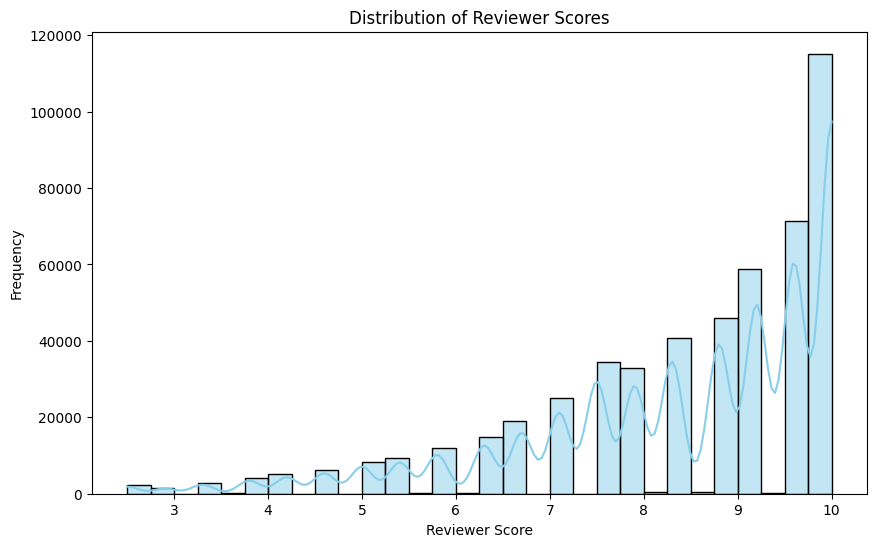

In [22]:
# Visualize the distribution of 'Reviewer_Score'
plt.figure(figsize=(10, 6))
sns.histplot(df['Reviewer_Score'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Reviewer Scores')
plt.xlabel('Reviewer Score')
plt.ylabel('Frequency')
plt.show()

## Distribution of Reviewer Scores

The histogram above shows the frequency distribution of reviewer scores. The X-axis represents the score given by the reviewer, ranging from 0 to 10, and the Y-axis indicates the frequency of each score.

Key observations:

- A significant majority of reviews have high scores, with the most common score being 10, as indicated by the tallest bar on the right.
- There is a noticeable trend toward higher scores, with fewer reviews having lower scores, as the bars are markedly shorter on the left side of the histogram.
- The distribution is right-skewed, meaning most reviewers tend to give scores on the higher end of the scale.
- Scores of 5 and below are relatively infrequent compared to higher scores, suggesting general satisfaction among reviewers.

This distribution could imply that guests who choose to leave reviews are more often satisfied with their experience, or it may reflect a tendency of reviewers to rate their experiences positively.

In [23]:
df['Reviewer_Score'].value_counts

<bound method IndexOpsMixin.value_counts of 0          8.1
1          7.9
2         10.0
3         10.0
4          9.6
          ... 
511939    10.0
511940     9.2
511941     7.9
511942     9.2
511943     2.9
Name: Reviewer_Score, Length: 511944, dtype: float64>

In [24]:
# If your 'Reviewer_Score' column has decimals, you might want to round them for better presentation
df['Reviewer_Score'] = df['Reviewer_Score'].round().astype(int)

# Get the value counts
score_counts = df['Reviewer_Score'].value_counts()

# Display the value counts
print("Reviewer Score Value Counts:")
print(score_counts)

Reviewer Score Value Counts:
Reviewer_Score
10    186594
8     109220
9     104878
7      43758
6      27587
5      24001
4       9357
3       4371
2       2178
Name: count, dtype: int64


Let's create a new column 'Sentiment' where a score greater than or equal to the threshold is labeled as 'good' and a score below the threshold is labeled as 'bad'. 

In [25]:
# Define the threshold for classifying as 1 or 0
threshold = 7

# Create a new column 'Sentiment' with binary labels
df['Sentiment'] = df['Reviewer_Score'].apply(lambda score: 1 if score >= threshold else 0)

# Display the counts of '1' and '0'
sentiment_counts = df['Sentiment'].value_counts()
print("Sentiment Value Counts:")
print(sentiment_counts)

Sentiment Value Counts:
Sentiment
1    444450
0     67494
Name: count, dtype: int64


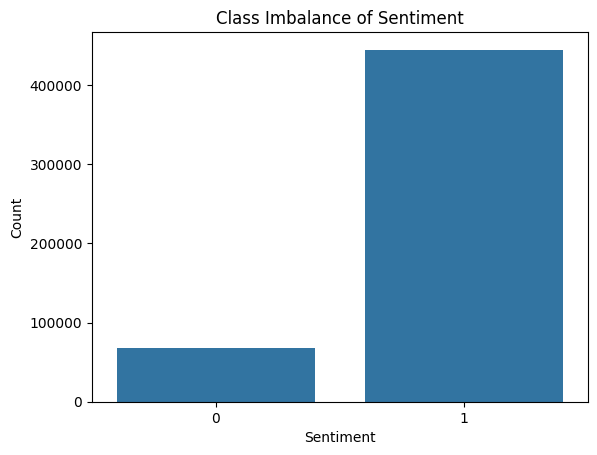

In [26]:
# Assuming 'Sentiment' is the column with binary labels
sns.countplot(x='Sentiment', data=df)
plt.title('Class Imbalance of Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

### Class Imbalance of Sentiment

The bar chart illustrates a significant class imbalance between the two sentiment categories. The number of positive sentiments (1) vastly exceeds the negative sentiments (0), indicating that a majority of the reviews are positive. This imbalance can affect the performance of machine learning models, necessitating resampling techniques to ensure balanced training data.

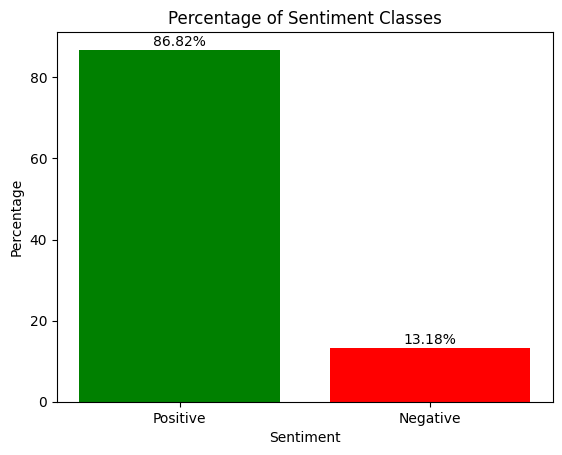

In [27]:
# Assuming 'Sentiment' is the column with binary labels
sentiment_counts = df['Sentiment'].value_counts()

# Calculate the percentage of each sentiment class
percentage_positive = (sentiment_counts[1] / len(df)) * 100
percentage_negative = (sentiment_counts[0] / len(df)) * 100

# Plotting the bar chart
plt.bar(['Positive', 'Negative'], [percentage_positive, percentage_negative], color=['green', 'red'])
plt.title('Percentage of Sentiment Classes')
plt.xlabel('Sentiment')
plt.ylabel('Percentage')

# Displaying percentage numbers over the bars
for i, percentage in enumerate([percentage_positive, percentage_negative]):
    plt.text(i, percentage + 1, f'{percentage:.2f}%', ha='center')

plt.show()


In [28]:
# Display count and first few unique values
print("Count and Unique Negative Values:")
print(df['Negative_Review'].value_counts().head(10))

print("\nCount and Unique Positive Values:")
print(df['Positive_Review'].value_counts().head(10))

Count and Unique Negative Values:
Negative_Review
No Negative    126902
 Nothing        14220
 Nothing         4209
 nothing         2206
 N A             1031
 None             978
                  835
 N a              506
 Breakfast        405
 Small room       371
Name: count, dtype: int64

Count and Unique Positive Values:
Positive_Review
No Positive        35695
 Location           9169
 Everything         2277
 location           1670
 Nothing            1233
 The location       1116
 Great location     1040
 Good location       924
 Location            910
 Everything          609
Name: count, dtype: int64


Here we are going to examine and visualize the dataset to gain insights, identify patterns, and understand the structure and characteristics of the data.

#### correlation analysis between the numerical columns:

In [29]:
# Select only numeric columns for correlation analysis
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
numeric_data = df[numeric_columns]

# Compute the correlation matrix
correlation_matrix = numeric_data.corr()
correlation_matrix

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng,Sentiment
Additional_Number_of_Scoring,1.000000,-0.154171,0.029208,0.825228,-0.053025,-0.071675,-0.059846,0.336270,-0.295876,-0.046689
Average_Score,-0.154171,1.000000,-0.112663,-0.180215,0.106912,0.036932,0.359477,-0.108804,0.106100,0.254654
Review_Total_Negative_Word_Counts,0.029208,-0.112663,1.000000,0.035129,0.119196,0.003030,-0.378360,0.019116,-0.020012,-0.308344
Total_Number_of_Reviews,0.825228,-0.180215,0.035129,1.000000,-0.029981,-0.024992,-0.071050,0.100262,-0.014200,-0.047200
Review_Total_Positive_Word_Counts,-0.053025,0.106912,0.119196,-0.029981,1.000000,0.026489,0.216691,-0.037590,0.035475,0.157778
Total_Number_of_Reviews_Reviewer_Has_Given,-0.071675,0.036932,0.003030,-0.024992,0.026489,1.000000,0.002133,-0.059805,0.110855,0.028970
Reviewer_Score,-0.059846,0.359477,-0.378360,-0.071050,0.216691,0.002133,1.000000,-0.034950,0.032502,0.790414
lat,0.336270,-0.108804,0.019116,0.100262,-0.037590,-0.059805,-0.034950,1.000000,-0.304546,-0.028425
lng,-0.295876,0.106100,-0.020012,-0.014200,0.035475,0.110855,0.032502,-0.304546,1.000000,0.031965
Sentiment,-0.046689,0.254654,-0.308344,-0.047200,0.157778,0.028970,0.790414,-0.028425,0.031965,1.000000


The correlation coefficients were not showing in the heatmap hence I tried to put those manually using for loop.

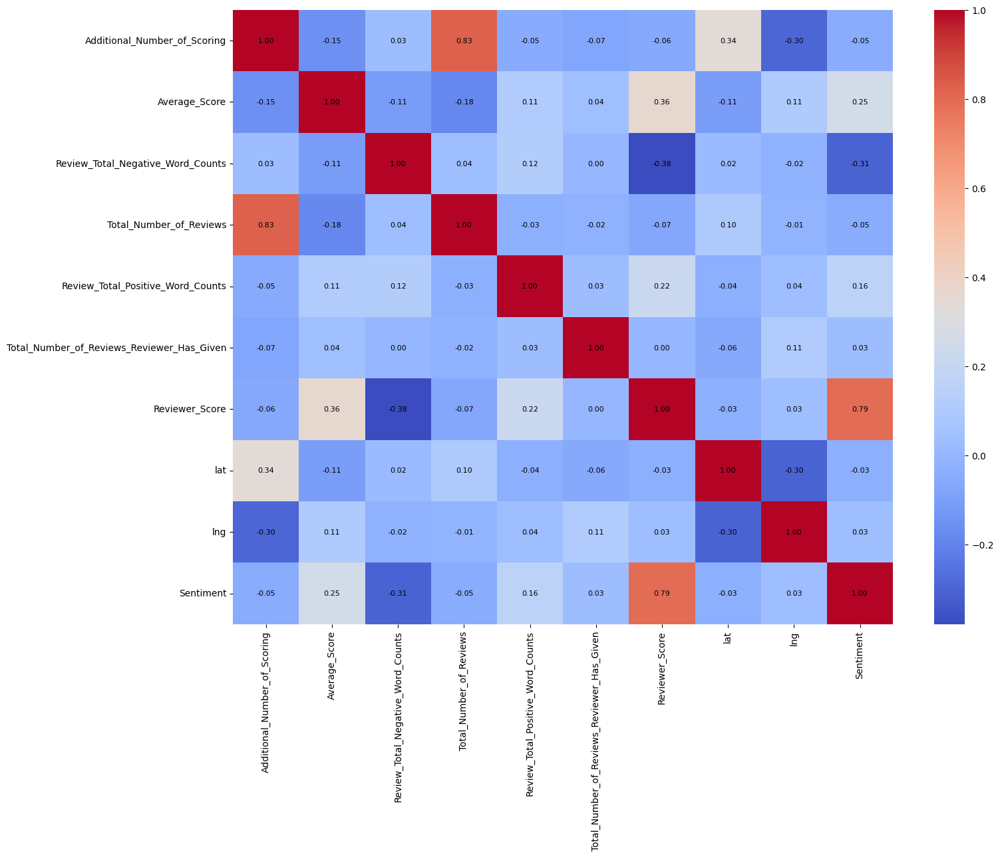

In [30]:
# display the heatmap for correlation matrix:
plt.figure(figsize=(16, 12))

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Plot the heatmap without annotations
sns.heatmap(corr_matrix, cmap='coolwarm')

# Add annotations manually
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        plt.text(j + 0.5, i + 0.5, f"{corr_matrix.iloc[i, j]:.2f}", ha='center', va='center', fontsize=8)

plt.show()

Findings:

* The columns 'Additional_Number_of_Scoring' and 'Total_Number_of_Reviews' exhibit a strong positive correlation of approximately 0.82.
* The columns "Year" and "Days_Since_Review" have a very high negative correlation of -0.92.
* The columns 'Hotel_Address_Vienna' and 'Longitude' have a strong positive correlation of approximately 0.82.
* The columns 'Hotel_Address_Barcelona' and 'Latitude' have a strong negative correlation of approximately -0.84.
* Since the dummy columns represent one-hot-encoded categorical variables, they might not have meaningful correlations with other numerical features.

Let's see the distribution of each column in our dataset.

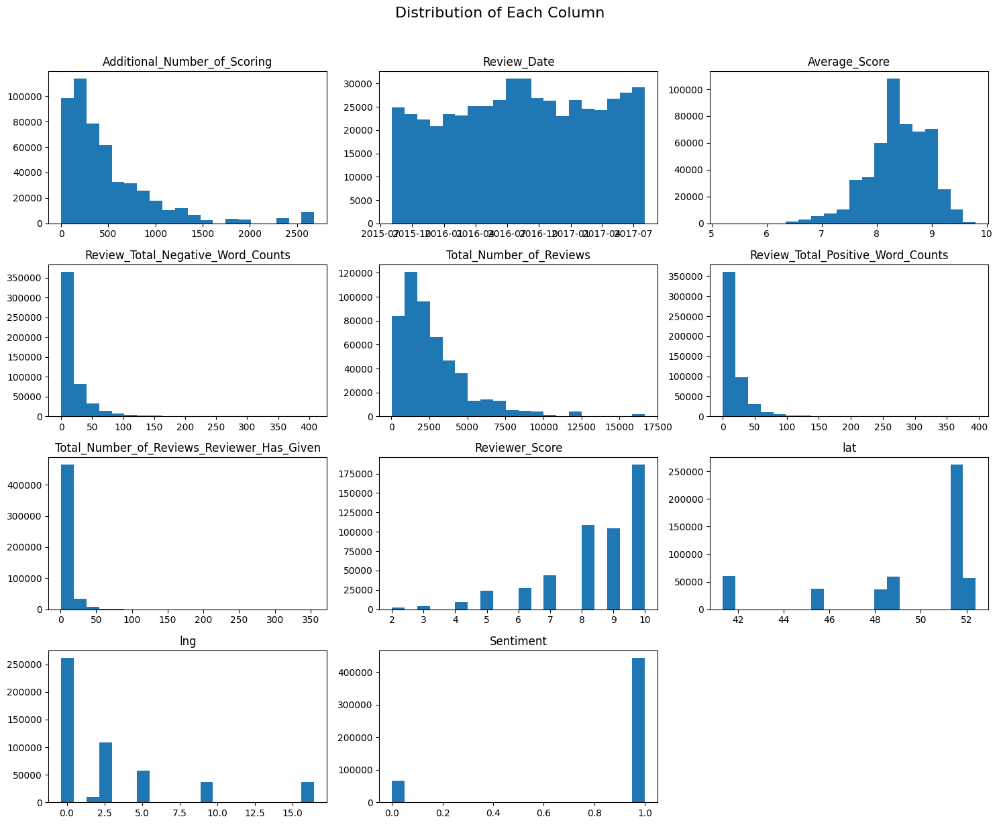

In [31]:
# Plot histograms for each column in a grid
df.hist(figsize=(15, 12), bins=20, grid=False)
plt.suptitle("Distribution of Each Column", y=1.02, size=16)
plt.tight_layout()

plt.show()

#### Observation 2:
Let's analyze the distribution of reviewer scores by hotel location

It appears that the specific hotel location information is encoded in columns like 'Hotel_Address_Amsterdam', 'Hotel_Address_Barcelona', 'Hotel_Address_London', and so on.

We can aggregate the information across these columns to get an overall understanding of the distribution of reviewer scores by hotel location. We can do this by creating a new column that combines the city information from these columns.

creating a list named city_columns containing the names of binary columns related to hotel addresses in different cities. Each element in the list corresponds to a specific city, and the binary values in these columns typically indicate whether the hotel is located in that city or not.

In [32]:
df['Hotel_Address'].sample(20)

195842    1 Inverness Terrace Westminster Borough London...
77491     Westminster Bridge Road Lambeth London SE1 7UT...
370839    43 51 Wembley Hill Road Brent London HA9 8AU U...
421554    Royal Victoria Dock Western Gateway Newham Lon...
146374    Pla a Urquinaona 2 Eixample 08010 Barcelona Spain
396331    Via Laietana 17 Ciutat Vella 08003 Barcelona S...
324723    Kleine Stadtgutgasse 4 02 Leopoldstadt 1020 Vi...
350340    380 Kensington High Street Kensington and Chel...
26760       Via Manin 7 Milan City Center 20121 Milan Italy
205700    Stephansplatz 9 01 Innere Stadt 1010 Vienna Au...
456535    Damrak 96 Amsterdam City Center 1012 LP Amster...
106515    Lancaster Terrace Hyde Park Westminster Boroug...
89785     Schwedenplatz 3 4 01 Innere Stadt 1010 Vienna ...
54688     Coram Street Camden London WC1N 1HT United Kin...
45525     Corso di Porta Vigentina 46 Milan City Center ...
342503     Lakeside Way Brent London HA9 0BU United Kingdom
33127      88 Bis Avenue Kl ber 16th arr

Distribution of hotel cities:

Finding:

It looks like the majority of the hotels are located in London, followed by Barcelona, Paris, and then Amsterdam.

The 'Hotel_Location' column was initially included in the dataset for the purpose of visualizing and plotting graphs during the exploratory data analysis (EDA) phase. However, it is not utilized in the subsequent modeling or analysis steps.

Reasons for Dropping:
- **Exploratory Data Analysis (EDA):** The column was used primarily for visualizing geographic information to gain insights during the EDA phase.
- **Redundancy with Hotel Address:** Location information is already preserved in the form of dummy variables created from the 'Hotel_Address' column. These dummy variables capture the geographical details effectively.

In [33]:
# Extract the month and year into separate columns
df['Month'] = df['Review_Date'].dt.month
df['Year'] = df['Review_Date'].dt.year

# Display the DataFrame with the new 'Month' and 'Year' columns
print(df[['Review_Date', 'Month', 'Year']])

       Review_Date  Month  Year
0       2015-08-04      8  2015
1       2015-08-04      8  2015
2       2015-08-04      8  2015
3       2015-08-04      8  2015
4       2015-08-04      8  2015
...            ...    ...   ...
511939  2017-08-03      8  2017
511940  2017-08-03      8  2017
511941  2017-08-03      8  2017
511942  2017-08-03      8  2017
511943  2017-08-03      8  2017

[511944 rows x 3 columns]


In [34]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,Sentiment,Month,Year
0,Ijburglaan 539 Zeeburg 1087 BE Amsterdam Nethe...,253,2015-08-04,8.4,Amadi Panorama Hotel,Italy,the hall down is not very nice,9,2586,room very nice the panorama from the window,10,119,8,"[' Business trip ', ' Solo traveler ', ' Delux...",730 day,52.358881,4.988604,1,8,2015
1,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,United Kingdom,Paid parking,3,2332,Good location,3,1,8,"[' Leisure trip ', ' Couple ', ' Double or Twi...",730 day,51.508372,0.035577,1,8,2015
2,25 Avenue Montaigne 8th arr 75008 Paris France,34,2015-08-04,9.3,Hotel Plaza Athenee Paris,United Arab Emirates,Sound proofing should be improved to enhance ...,15,160,Amazing atmosphere Very positive vibe,7,2,10,"[' Leisure trip ', ' Couple ', ' Deluxe Double...",730 day,48.866193,2.304214,1,8,2015
3,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,Malaysia,No Negative,0,2332,The bed was the best I had in 2 weeks of trav...,27,15,10,"[' Leisure trip ', ' Couple ', ' Double or Twi...",730 day,51.508372,0.035577,1,8,2015
4,97 avenue des Ternes 17th arr 75017 Paris France,87,2015-08-04,8.6,La Villa des Ternes,United States of America,No Negative,0,937,Great place Good location although not centra...,17,1,10,"[' Leisure trip ', ' Solo traveler ', ' Superi...",730 day,48.880348,2.285824,1,8,2015


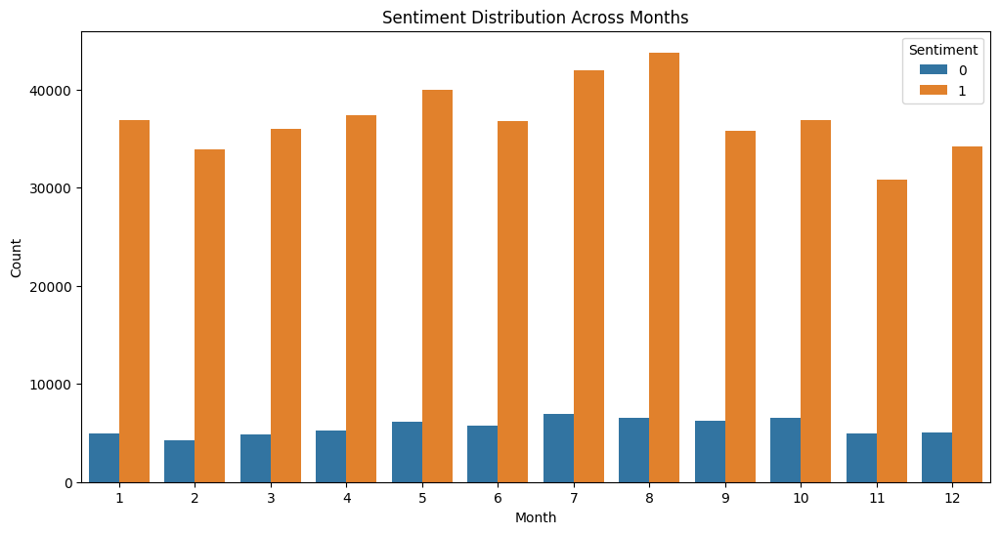

In [35]:
# Plotting sentiment across months
plt.figure(figsize=(12, 6))
sns.countplot(x='Month', hue='Sentiment', data=df)
plt.title('Sentiment Distribution Across Months')
plt.xlabel('Month')
plt.ylabel('Count')
plt.legend(title='Sentiment', loc='upper right')
plt.show()

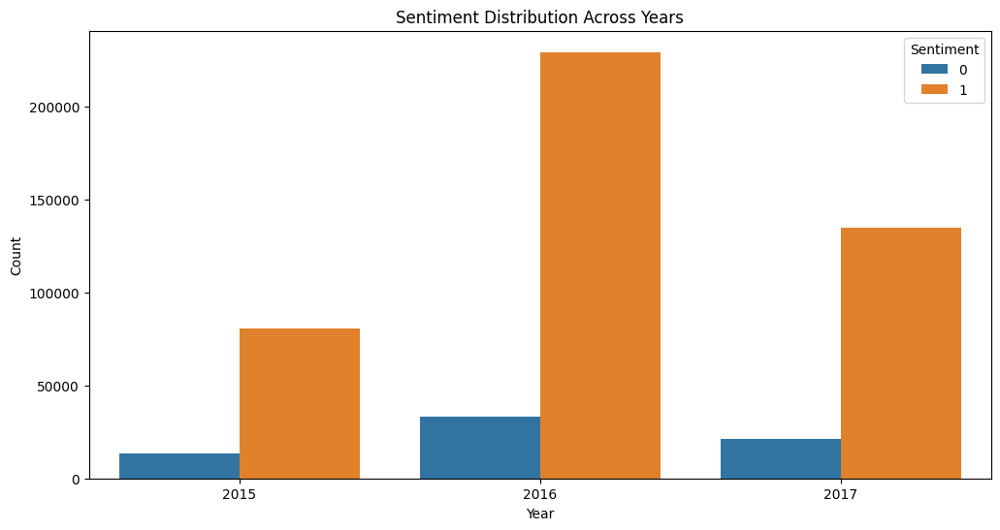

In [36]:
# Plotting sentiment across years
plt.figure(figsize=(12, 6))
sns.countplot(x='Year', hue='Sentiment', data=df)
plt.title('Sentiment Distribution Across Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Sentiment', loc='upper right')
plt.show()

### Sine and Cosine Encoding for 'Month':
This approach will map each month to a point on a unit circle, preserving its cyclical nature.

In [37]:
# Sine and Cosine transformation for 'Month'
df['Month_Sin'] = np.sin(2 * np.pi * df['Month']/12)
df['Month_Cos'] = np.cos(2 * np.pi * df['Month']/12)

### Ordinal Encoding for 'Year':
We want to maintain the chronological order in encoding.

In [38]:
# Ordinal Encoding for 'Year'
# This approach assumes that the year column is sorted or in chronological order
years = df['Year'].unique()
years.sort()  # Sorting the years if not already sorted
year_mapping = {year: idx for idx, year in enumerate(years)}
df['Year_Ordinal'] = df['Year'].map(year_mapping)

In [39]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,...,Tags,days_since_review,lat,lng,Sentiment,Month,Year,Month_Sin,Month_Cos,Year_Ordinal
0,Ijburglaan 539 Zeeburg 1087 BE Amsterdam Nethe...,253,2015-08-04,8.4,Amadi Panorama Hotel,Italy,the hall down is not very nice,9,2586,room very nice the panorama from the window,...,"[' Business trip ', ' Solo traveler ', ' Delux...",730 day,52.358881,4.988604,1,8,2015,-0.866025,-0.5,0
1,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,United Kingdom,Paid parking,3,2332,Good location,...,"[' Leisure trip ', ' Couple ', ' Double or Twi...",730 day,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0
2,25 Avenue Montaigne 8th arr 75008 Paris France,34,2015-08-04,9.3,Hotel Plaza Athenee Paris,United Arab Emirates,Sound proofing should be improved to enhance ...,15,160,Amazing atmosphere Very positive vibe,...,"[' Leisure trip ', ' Couple ', ' Deluxe Double...",730 day,48.866193,2.304214,1,8,2015,-0.866025,-0.5,0
3,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,Malaysia,No Negative,0,2332,The bed was the best I had in 2 weeks of trav...,...,"[' Leisure trip ', ' Couple ', ' Double or Twi...",730 day,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0
4,97 avenue des Ternes 17th arr 75017 Paris France,87,2015-08-04,8.6,La Villa des Ternes,United States of America,No Negative,0,937,Great place Good location although not centra...,...,"[' Leisure trip ', ' Solo traveler ', ' Superi...",730 day,48.880348,2.285824,1,8,2015,-0.866025,-0.5,0


## Review Average Score Distribution

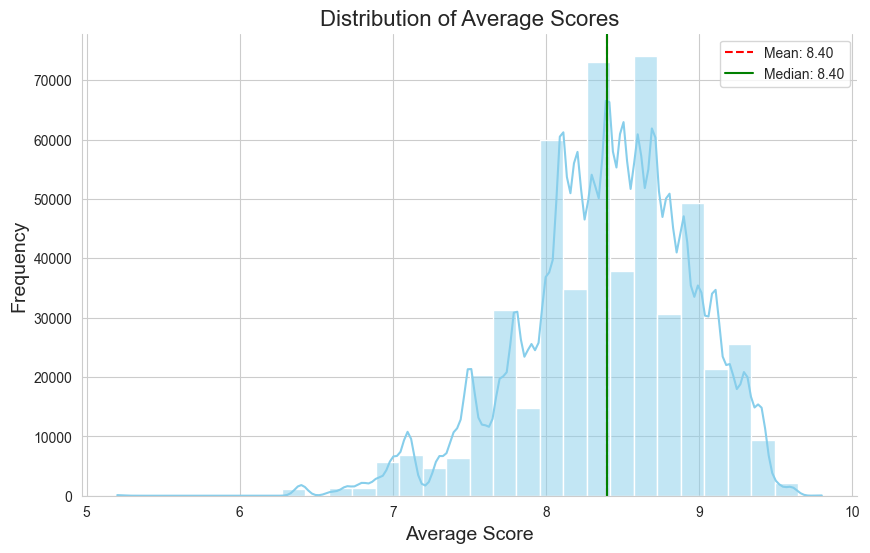

In [40]:
# Set the aesthetic style of the plots
sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))

# Plot the distribution of scores with KDE
ax = sns.histplot(df['Average_Score'], bins=30, kde=True, color='skyblue')

# Add vertical lines for the mean and median
plt.axvline(df['Average_Score'].mean(), color='red', linestyle='--', label=f"Mean: {df['Average_Score'].mean():.2f}")
plt.axvline(df['Average_Score'].median(), color='green', linestyle='-', label=f"Median: {df['Average_Score'].median():.2f}")

# Add title and labels
plt.title('Distribution of Average Scores', fontsize=16)
plt.xlabel('Average Score', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Add legend
plt.legend()

# Remove grid lines and top-right spines
sns.despine()

# Show the plot
plt.show()

From the above graph, we can infer that -

- This histogram with a Kernel Density Estimate overlay shows the distribution of average scores. 
- The mean and median are both marked and coincide at a score of 8.40, indicating a symmetrical distribution around this central value. The plot suggests that most hotels have a high level of guest satisfaction, with scores clustering around the mean.
- There is a notable peak around 8.5 to 9, indicating this is the most common range for hotel scores. 
- The distribution suggests that very few hotels have average scores close to 5 or a perfect 10, with a general skew towards higher ratings. 
- This pattern implies that guests tend to be satisfied with their hotel stays, or it reflects a selection of generally higher-rated hotels in the dataset.

## Difference Between Total Positive and Negative Word Count

In [41]:
# Compute the absolute difference within the plotting function
fig = px.histogram(df,
                   x=abs(df.Review_Total_Positive_Word_Counts -
                         df.Review_Total_Negative_Word_Counts),
                   title='Sentiment Word Count Difference in Reviews')

# Show the plot
fig.show()

## Analysis of Sentiment Word Count Differences

- The histogram depicts the distribution of the absolute differences between positive and negative word counts in hotel reviews. 
- The data shows a steep decline in frequency as the absolute difference increases, with a tail extending towards the right. 
- This indicates that most reviews have a relatively small difference between the counts of positive and negative words, pointing to a balance in sentiment expression within the reviews.

## Word Cloud for Positive Reviews:

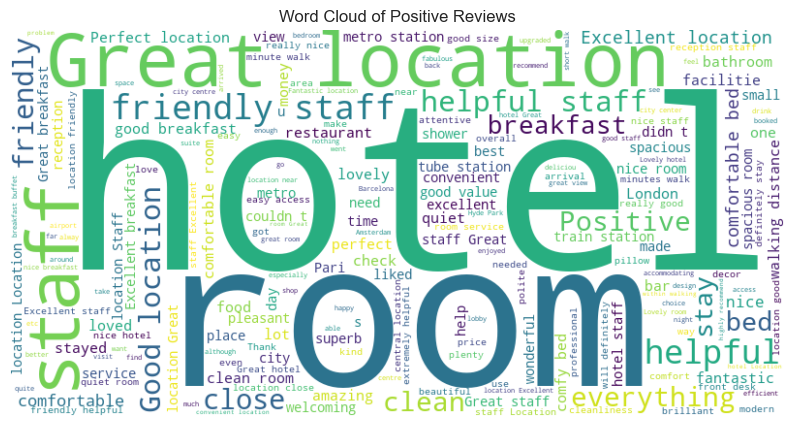

In [42]:
# Filter the DataFrame for positive sentiment instances
positive_reviews_df = df[df['Sentiment'] == 1]

# Combine all positive reviews into a single text
all_positive_reviews_text = " ".join(positive_reviews_df['Positive_Review'].astype(str))

# Generate word cloud for positive reviews
wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(all_positive_reviews_text)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud of Positive Reviews')
plt.axis('off')
plt.show()

##### Word Cloud Analysis for Positive Reviews

Upon analyzing the Word Cloud for Positive Reviews, certain prominent words stand out, represented by their larger size in the cloud. Notably, the terms "hotel," "room," "staff," "great location," "helpful," and "friendly" appear to be more frequently used and are visually emphasized.

This suggests that positive reviews often highlight the positive aspects of the hotel, such as its great location, helpful staff, and friendly atmosphere, contributing to the overall positive sentiments expressed by reviewers.

Location: The word "location" is prominent, suggesting that many guests appreciated the hotel's location. This could mean it is conveniently situated for tourism, business, or accessibility to transport links.

Staff: The term "staff" is also very visible, along with the words "friendly" and "helpful," indicating that the service provided by the hotel personnel was a highlight for guests.

Room: The word "room" appears frequently, often in conjunction with positive adjectives like "clean," "comfortable," "nice," and "spacious," implying satisfaction with the room quality and amenities.

Breakfast: Many reviewers mentioned "breakfast," suggesting it is a significant positive aspect of their stay.

Clean and Comfortable: Both "clean" and "comfortable" are quite large, indicating that these are common descriptors used by guests, which are crucial factors for a positive hotel experience.


Word Cloud for Negative Reviews:

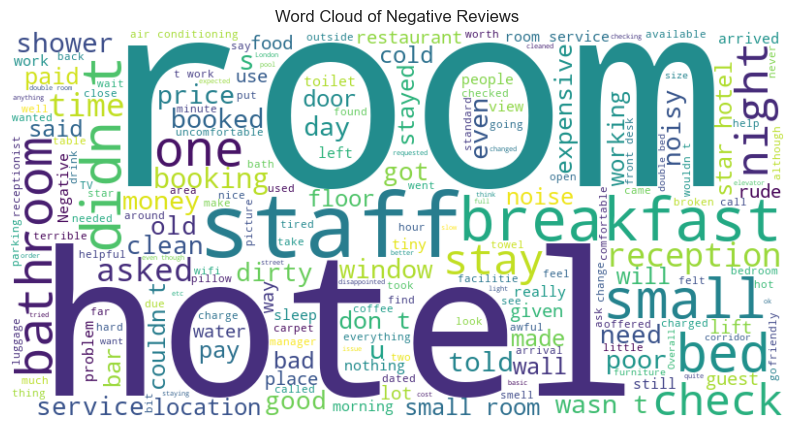

In [43]:
# Filter the DataFrame for positive sentiment instances
negative_reviews_df = df[df['Sentiment'] == 0]

# Combine all positive reviews into a single text
all_negative_reviews_text = " ".join(negative_reviews_df['Negative_Review'].astype(str))

# Generate word cloud for positive reviews
wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(all_negative_reviews_text)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud of Negative Reviews')
plt.axis('off')
plt.show()

As the same words were found to be commonly used in both positive and negative reviews, I opted to enhance the analysis by introducing the stopwords parameter in the WordCloud object. By doing so, I excluded these frequently occurring words to uncover additional insights into the specific language used in negative reviews.

Room and Bathroom: These words are very prominent, indicating that many negative comments were related to the rooms and bathrooms, with adjectives like "small," "old," "dirty," and "tiny" suggesting dissatisfaction with size, cleanliness, and possibly the state of repair.

Breakfast: Just as it was a positive point in the previous word cloud, here it stands out as a negative aspect, possibly indicating issues with the quality or variety of the food.

Staff and Service: Unlike in the positive reviews, words like "staff" and "service" appear in the negative word cloud, but this time likely associated with negative experiences or poor service quality.

Noise: The word "noise" suggests that sound insulation may be an issue, affecting guests' sleep or overall comfort.

Cold: This word might refer to the temperature in the rooms, indicating that guests found them uncomfortably cold.

Booked, Overbooked, Full: These terms indicate problems with reservations, perhaps implying overbooking or issues with guests not getting the rooms they reserved.

Expensive, Price, Paid, Money: These words are likely associated with comments about the hotel not offering good value for the money.

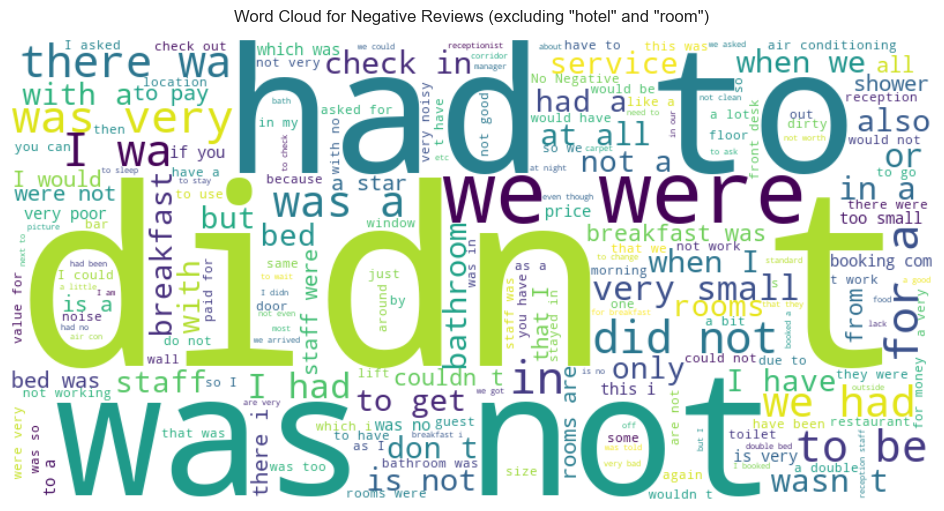

In [44]:
# Define stopwords
custom_stopwords = ["hotel", "room", "it", "of", "the", "on", "and"]

# Generate word cloud for negative reviews with stopwords
wordcloud_negative_custom_stopwords = WordCloud(
    width=800, height=400, background_color='white', stopwords=custom_stopwords
).generate(all_negative_reviews_text)

# Plot word cloud for negative reviews using matplotlib
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_negative_custom_stopwords, interpolation='bilinear')
plt.title('Word Cloud for Negative Reviews (excluding "hotel" and "room")', y=1.02)  # Adjust the y parameter for spacing
plt.axis('off')
plt.show()

##### Word Cloud Analysis for Negative Reviews:

In the Word Cloud for Negative Reviews, distinct patterns emerge with certain words appearing prominently, emphasized by their larger size. Notably, words such as "breakfast," "no," "negative," "didn't," "had," "bathroom," and "small" stand out.

These frequently occurring terms suggest that negative reviews often mention aspects like issues with breakfast, negative experiences, dissatisfaction with amenities such as the bathroom, and the perception of limited space. Understanding these key words provides insights into the common concerns expressed by reviewers in their negative feedback.


## Reviewer Nationality

In [45]:
df.Reviewer_Nationality.nunique()

227

In [46]:
# Get the top 10 reviewer nationalities with the most reviews
nationality = df["Reviewer_Nationality"].value_counts(dropna=False)[:10]

# Create a bar chart of the nationalities and review counts
fig = px.bar(x=nationality.index, y=nationality.values,
             title="Top 10 Nationalities of Reviewers")
fig.update_layout(xaxis_title="Nationality", yaxis_title="Review Count", font=dict(size=14))

# Set a single color for all bars
fig.update_traces(marker_color="coral")

fig.show()

## Top 10 Nationalities of Reviewers

The horizontal bar chart presents the counts of hotel reviews grouped by the top ten nationalities of the reviewers. The chart helps to identify which nationalities are most active in providing reviews for the dataset under consideration. The X-axis lists the nationalities, and the Y-axis shows the corresponding review counts.

Observations from the chart are as follows:

- **United Kingdom (UK)** leads with the highest count of reviews, represented by the first bar on the left, which significantly surpasses the others.
- The **United States of America (USA)** holds the second rank in the number of reviews, with a noticeable drop from the UK.
- **Australia** appears third, with fewer reviews than the USA but still a substantial number.
- The rest of the nationalities, including **Ireland, United Arab Emirates, Saudi Arabia, Netherlands, Switzerland, Germany**, and **Canada**, have progressively smaller numbers of reviews, indicating a lower frequency of reviews from these nationalities compared to the top three.
- The uniform orange color across all bars focuses the viewer on the review counts rather than the nationality, ensuring the data speaks for itself without the distraction of varying colors.

This chart clearly demonstrates the dominance of the UK in this dataset and suggests potential areas for targeted marketing or customer service improvement based on the nationalities of the reviewers.

Relationship between "Total_Number_of_Reviews" and the "Year". Line plot to show how the total number of reviews has changed over the years.

the "Year" values are in decimal form, we can convert them to integers before creating the plot.

In [47]:
df["Hotel_Name"].nunique()

1475

## Top 10 Hotels with the Most Reviews

In [48]:
# Get the top 10 hotels with the most reviews
names = df["Hotel_Name"].value_counts(dropna=False)[:10]

# Create a bar chart of the hotels and review counts
fig = px.bar(x=names.index, y=names.values,
             title="Top 10 Hotels with the Most Reviews")
fig.update_layout(xaxis_title="Hotel Name", yaxis_title="Review Count", font=dict(size=14))

# Set a single color for all bars
fig.update_traces(marker_color="skyblue")

fig.show()

The bar chart displays the top 10 hotels ranked by the number of reviews they have received. Each hotel has a substantial number of reviews, with the "Britannia International Hotel Canary Wharf" leading. The number of reviews for each hotel is fairly close, indicating that these hotels are popular choices among reviewers. This data can be valuable for potential guests seeking popular hotels and for the hotels themselves to gauge their visibility in the market.

In [49]:
df['Year'].unique()

array([2015, 2016, 2017], dtype=int32)

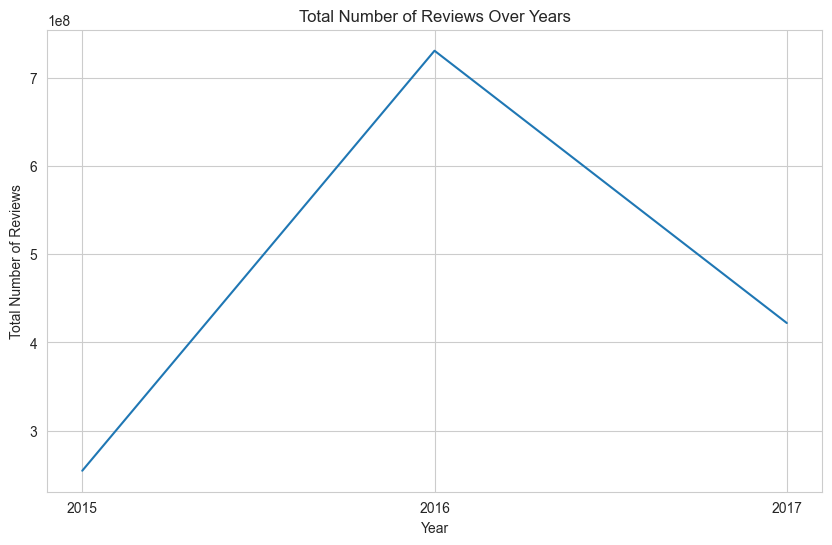

In [50]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Total_Number_of_Reviews', data=df, estimator='sum', ci=None)
plt.title('Total Number of Reviews Over Years')
plt.xlabel('Year')
plt.ylabel('Total Number of Reviews')
plt.xticks(df['Year'].unique())  # Set explicit x-axis ticks since it was showing decimal points on the x-axis without it.
plt.show()

### Analysis of Total Number of Reviews Over Years

The above plot provides valuable insights into the distribution of total reviews over the years.

The line plot visualizes the total number of reviews for each year, revealing interesting patterns in user engagement over time. The following key observations can be made:

- **2016 Dominates:** The year 2016 stands out with the highest total number of reviews, indicating a peak in user activity during that period.

- **2017 Follows:** Following closely, the year 2017 shows a substantial number of reviews, suggesting sustained user engagement, although slightly lower than the peak observed in 2016.

- **2015 Trails Behind:** In comparison, the year 2015 lags in total reviews, indicating a lower level of user activity during that specific year.

This analysis provides valuable insights into the temporal dynamics of user reviews, highlighting variations in user engagement across different years. 


### Temporal Analysis:

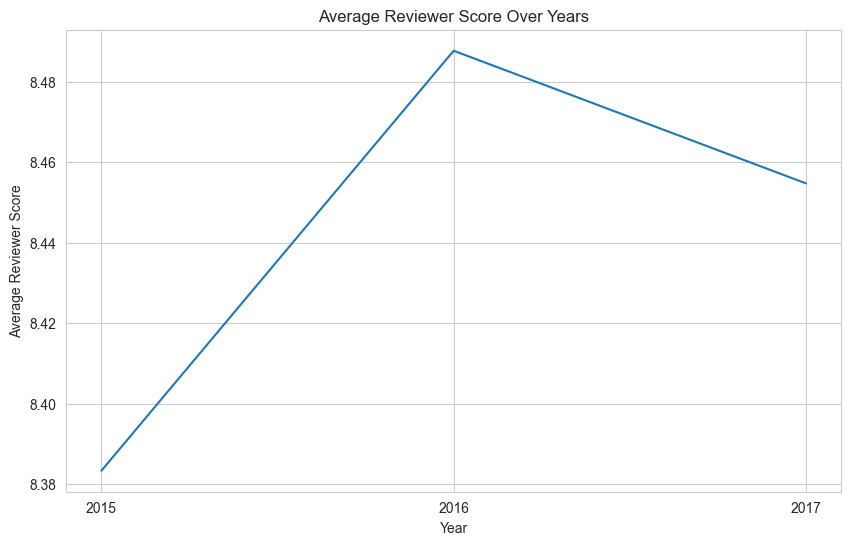

In [51]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Reviewer_Score', data=df, estimator='mean', ci=None)
plt.title('Average Reviewer Score Over Years')
plt.xlabel('Year')
plt.ylabel('Average Reviewer Score')
plt.xticks(sorted(df['Year'].unique()))  # Ensure the x-axis ticks are sorted.
plt.show()

## Average Reviewer Score Over Years

The line chart illustrates the trend in average reviewer scores from 2015 to 2017. There is a noticeable increase in average scores from 2015 to 2016, followed by a decline in 2017. This suggests that while there was an improvement in guest satisfaction or hotel quality in 2016, it either did not sustain or faced a slight downturn by 2017. This trend could warrant further investigation into the factors contributing to the fluctuation in reviewer scores during these years.

## Review Sentiment Distribution

In [52]:
print(f"Total Positive word count {df.Review_Total_Positive_Word_Counts.sum()}, Total negative word count {df.Review_Total_Negative_Word_Counts.sum()}")

Total Positive word count 9095632, Total negative word count 9493104


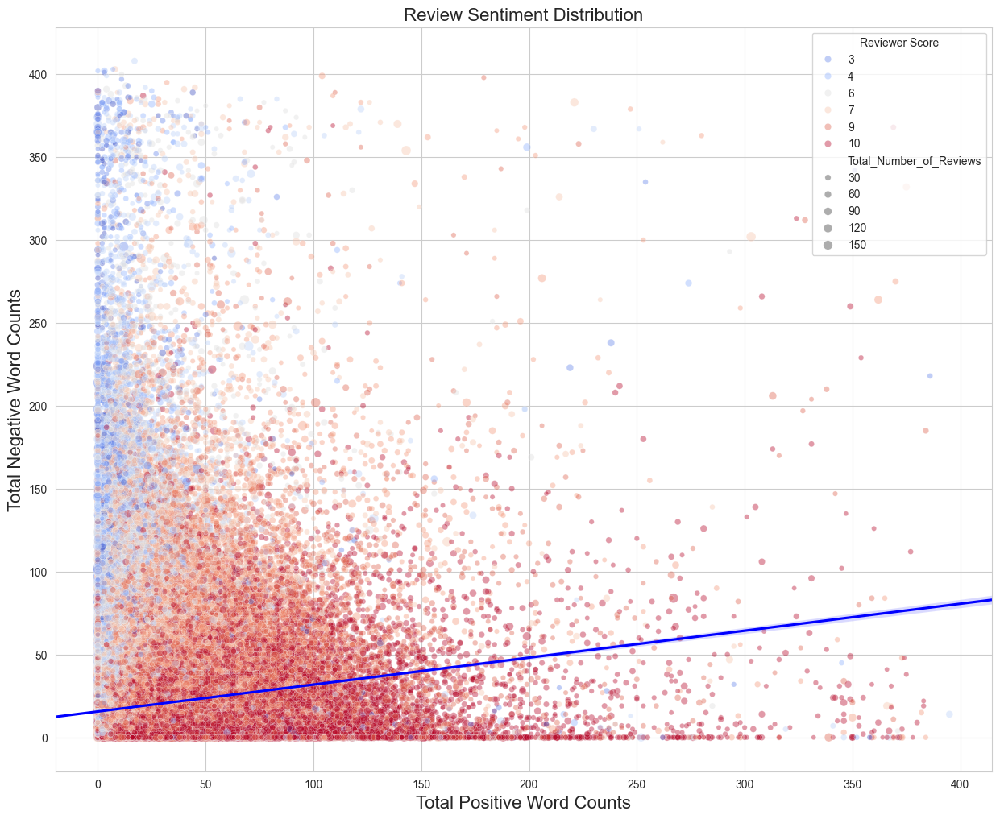

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the font size
font_size = 16
# Setting the size of the plot
plt.figure(figsize=(15, 12))

# Creating the scatter plot with seaborn for better aesthetics and fit line
sns.scatterplot(data=df,
                x='Review_Total_Positive_Word_Counts',
                y='Review_Total_Negative_Word_Counts',
                size=df.Total_Number_of_Reviews/100,  # Adjust size scale as needed
                hue='Reviewer_Score',
                palette='coolwarm',  # A perceptually uniform colormap
                alpha=0.4)

# Adding a regression line to see the trend
sns.regplot(data=df,
            x='Review_Total_Positive_Word_Counts',
            y='Review_Total_Negative_Word_Counts',
            scatter=False,  # We don't want to double-plot the points
            color='blue',  # Color for the trend line
            truncate=False)  # Extend the line for the full axis range

# Customizing the plot
plt.title("Review Sentiment Distribution", fontsize=font_size)
plt.xlabel("Total Positive Word Counts", fontsize=font_size)
plt.ylabel("Total Negative Word Counts", fontsize=font_size)

# Legend for the sizes
handles, labels = plt.gca().get_legend_handles_labels()
# Adjust the labels to account for the size scaling factor
new_labels = [label for label in labels if label not in df.Total_Number_of_Reviews.unique()]
plt.legend(handles=handles[1:], labels=new_labels[1:], title='Reviewer Score')

plt.show()


## Review Sentiment Distribution

- The scatter plot visualizes the relationship between the total counts of positive and negative words in reviews. 
- The color gradient represents the reviewer score, with cooler colors indicating lower scores and warmer colors higher scores. 
- The size of the points correlates with the total number of reviews for each data point. 
- A trend line is included, showing a general pattern. Notably, reviews with a higher count of positive words tend to have higher reviewer scores, which is indicated by the density of points with warmer colors (indicating higher scores) towards the right side of the plot.


## Review Authenticity Indicators:
Accounting for review authenticity can significantly improve the integrity and applicability of your NLP analysis and any derived business insights.
Improving Data Quality: By identifying potentially fake reviews, you can either remove them from the dataset or correct for their influence, which leads to a more accurate and reliable analysis.

For a basic analysis of review authenticity indicators:

In [54]:
# A simple heuristic could be that very short or very long reviews are less likely to be authentic
df['Potential_Fake'] = ((df['Review_Total_Positive_Word_Counts'] < 5) | (df['Review_Total_Negative_Word_Counts'] > 150)).astype(int)

In [55]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,...,days_since_review,lat,lng,Sentiment,Month,Year,Month_Sin,Month_Cos,Year_Ordinal,Potential_Fake
0,Ijburglaan 539 Zeeburg 1087 BE Amsterdam Nethe...,253,2015-08-04,8.4,Amadi Panorama Hotel,Italy,the hall down is not very nice,9,2586,room very nice the panorama from the window,...,730 day,52.358881,4.988604,1,8,2015,-0.866025,-0.5,0,0
1,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,United Kingdom,Paid parking,3,2332,Good location,...,730 day,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0,1
2,25 Avenue Montaigne 8th arr 75008 Paris France,34,2015-08-04,9.3,Hotel Plaza Athenee Paris,United Arab Emirates,Sound proofing should be improved to enhance ...,15,160,Amazing atmosphere Very positive vibe,...,730 day,48.866193,2.304214,1,8,2015,-0.866025,-0.5,0,0
3,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,Malaysia,No Negative,0,2332,The bed was the best I had in 2 weeks of trav...,...,730 day,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0,0
4,97 avenue des Ternes 17th arr 75017 Paris France,87,2015-08-04,8.6,La Villa des Ternes,United States of America,No Negative,0,937,Great place Good location although not centra...,...,730 day,48.880348,2.285824,1,8,2015,-0.866025,-0.5,0,0


## Importance of Resampling in the Training Set

Resampling to address class imbalance is applied exclusively to the training set for two key reasons:
1. **Real-World Representation**: The test set should mimic real-world data distribution, which is often imbalanced. Balancing the test set would not accurately reflect real-world scenarios.
2. **Avoiding Overestimation and Data Leakage**: Resampling before splitting the dataset can lead to an inflated perception of model performance and potential data leakage. By resampling only the training set, we ensure that the model is evaluated against a realistic, unaltered test set, providing a genuine measure of its ability to generalize to new data.

## Balancing Sentiment

To ensure our model treats both positive and negative reviews equally, we've balanced the dataset by sampling an equal number of 'Good' and 'Bad' reviews. This resampling is crucial for avoiding a bias towards more frequent review types and for improving the predictive performance of our machine learning models on less represented classes.

The dataset is split into 'positive_df' and 'negative_df' based on the 'Sentiment' column, and then 'positive_df' is directly downsampled to match the size of 'negative_df'.

In [56]:
# # Separate the dataset into positive (1) and negative (0) sentiment
# positive_df = df[df['Sentiment'] == 1]
# negative_df = df[df['Sentiment'] == 0]

# # Downsample positive_sample to match the number of negative_reviews
# positive_df_downsampled = positive_df.sample(n=len(negative_df), random_state=42)

The downsampled 'positive_df' and 'negative_df' are concatenated into df_balanced.

In [57]:

# # Combine the downsampled positive reviews with the negative reviews into a single DataFrame
# df_balanced = pd.concat([positive_df_downsampled, negative_df]).reset_index(drop=True)

The shape and value counts of df_balanced are printed, and a count plot is shown to visualize the balanced classes.

In [58]:
# # Display the shape and the counts of each class in the balanced DataFrame
# print("Shape of the balanced dataset:", df_balanced.shape)
# print(df_balanced['Sentiment'].value_counts())

# # Create the countplot with the same color for both bars
# sns.countplot(x='Sentiment', data=df_balanced, color='coral')

# plt.xlabel("Sentiment")
# plt.title("Sentiment Distribution in Balanced Dataset")
# plt.show()

## Sentiment Distribution in Balanced Dataset

- The bar chart shows the sentiment distribution after applying resampling techniques to address the initial class imbalance. 
- Both negative (0) and positive (1) sentiments are now equally represented, ensuring a balanced dataset for subsequent machine learning tasks. This parity allows for better generalization and performance of predictive models.

## Preprocessing Text Data for Modeling:

## Verifying Placeholder Text in Reviews

There are some values like "No Positive" in positive review and "No Negative" in negative review which can be counted as opposite sentiment. We conducted a check to identify the presence of specific placeholder texts within our review dataset. The phrases 'No Positive' and 'No Negative' were searched for in their respective review columns

In [59]:
# Check if 'No Positive' exists in the Positive Review column
no_positive_exists = df['Positive_Review'].str.contains('No Positive').any()
print(f"'No Positive' exists in Positive_Review: {no_positive_exists}")

# Check if 'No Negative' exists in the Negative Review column
no_negative_exists = df['Negative_Review'].str.contains('No Negative').any()
print(f"'No Negative' exists in Negative_Review: {no_negative_exists}")

'No Positive' exists in Positive_Review: True
'No Negative' exists in Negative_Review: True


## Cleaning Review Text Data

- To ensure consistency in our text data, we've converted all reviews to lowercase, which allows us to accurately identify and replace placeholder texts like 'no positive' or 'no negative'. 
- Lowercasing ensures that the replacement is not case-sensitive and that all variations of the phrases "No Positive" and "No Negative" (like "no positive", "NO POSITIVE", etc.) are captured and replaced consistently.
- These placeholders have been replaced with empty strings to correctly reflect the absence of sentiment. This step is crucial for maintaining the integrity of our sentiment analysis, as it removes potential biases that could arise from counting such placeholders as actual sentiment expressions.

In [60]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,...,days_since_review,lat,lng,Sentiment,Month,Year,Month_Sin,Month_Cos,Year_Ordinal,Potential_Fake
0,Ijburglaan 539 Zeeburg 1087 BE Amsterdam Nethe...,253,2015-08-04,8.4,Amadi Panorama Hotel,Italy,the hall down is not very nice,9,2586,room very nice the panorama from the window,...,730 day,52.358881,4.988604,1,8,2015,-0.866025,-0.5,0,0
1,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,United Kingdom,Paid parking,3,2332,Good location,...,730 day,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0,1
2,25 Avenue Montaigne 8th arr 75008 Paris France,34,2015-08-04,9.3,Hotel Plaza Athenee Paris,United Arab Emirates,Sound proofing should be improved to enhance ...,15,160,Amazing atmosphere Very positive vibe,...,730 day,48.866193,2.304214,1,8,2015,-0.866025,-0.5,0,0
3,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,Malaysia,No Negative,0,2332,The bed was the best I had in 2 weeks of trav...,...,730 day,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0,0
4,97 avenue des Ternes 17th arr 75017 Paris France,87,2015-08-04,8.6,La Villa des Ternes,United States of America,No Negative,0,937,Great place Good location although not centra...,...,730 day,48.880348,2.285824,1,8,2015,-0.866025,-0.5,0,0


In [61]:
# Convert the review text to lowercase
df['Positive_Review'] = df['Positive_Review'].str.lower()
df['Negative_Review'] = df['Negative_Review'].str.lower()

# Replace 'no positive' and 'no negative' with an empty string
df['Positive_Review'] = df['Positive_Review'].replace('no positive', '')
df['Negative_Review'] = df['Negative_Review'].replace('no negative', '')

# Optionally, strip whitespace if the replacement leaves leading/trailing spaces
df['Positive_Review'] = df['Positive_Review'].str.strip()
df['Negative_Review'] = df['Negative_Review'].str.strip()

# Sanity checks to confirm the replacements
no_positive_still_exists = 'no positive' in df['Positive_Review'].values
no_negative_still_exists = 'no negative' in df['Negative_Review'].values
print(f"'no positive' still exists: {no_positive_still_exists}")
print(f"'no negative' still exists: {no_negative_still_exists}")

'no positive' still exists: False
'no negative' still exists: False


## Combine Positive and Negative Reviews
We will combine the 'Positive_Review' and 'Negative_Review' columns into a new 'Combined_Review' column by simply adding a space between the contents of the two columns. This way, we preserve the integrity of the original text while preparing our data for further text processing steps.

In [62]:
df['Combined_Review'] = df['Positive_Review'] + ' ' + df['Negative_Review']

## Basic Text Cleaning Function

A custom function `basic_text_cleaning` is defined and applied to the 'Combined_Review' column to perform initial text cleaning. This function standardizes the text data by:
- Converting all text to lowercase for uniformity.
- Removing punctuation, special characters, and numbers to focus on the textual content.

Applying this cleaning process across the entire dataset ensures a consistent and clean input for further advanced text processing steps.

In [63]:
import re

def basic_text_cleaning(text):
    """
    Perform basic text cleaning including:
    - Converting to lowercase.
    - Removing punctuation.
    - Removing numbers and special characters.
    """
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation and special characters/numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

# Apply the function to the 'Combined_Review' column
df['Combined_Review'] = df['Combined_Review'].apply(basic_text_cleaning)

We split the data into train and test sets first, then we perform preprocessing, including text processing, separately on the train and test sets to avoid data leakage.
We want to ensure that our model generalizes well to unseen data.

Dividing the dataset into training and testing sets is the next step. We'll allocate 80% of the data for training and reserve 20% for testing. To maintain consistency in results, we'll set the random state to 42. Additionally, the stratify parameter will be applied to the Reviewer_Score column, guaranteeing that both the training and testing sets maintain the same distribution of positive and negative reviews.

In [64]:
unique_hotels = df['Hotel_Name'].nunique()
print(f"Number of unique hotels: {unique_hotels}")

Number of unique hotels: 1475


In [65]:
df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,...,lat,lng,Sentiment,Month,Year,Month_Sin,Month_Cos,Year_Ordinal,Potential_Fake,Combined_Review
0,Ijburglaan 539 Zeeburg 1087 BE Amsterdam Nethe...,253,2015-08-04,8.4,Amadi Panorama Hotel,Italy,the hall down is not very nice,9,2586,room very nice the panorama from the window,...,52.358881,4.988604,1,8,2015,-0.866025,-0.5,0,0,room very nice the panorama from the window th...
1,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,United Kingdom,paid parking,3,2332,good location,...,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0,1,good location paid parking
2,25 Avenue Montaigne 8th arr 75008 Paris France,34,2015-08-04,9.3,Hotel Plaza Athenee Paris,United Arab Emirates,sound proofing should be improved to enhance t...,15,160,amazing atmosphere very positive vibe,...,48.866193,2.304214,1,8,2015,-0.866025,-0.5,0,0,amazing atmosphere very positive vibe sound pr...
3,One Eastern Gateway Royal Victoria Dock Newham...,694,2015-08-04,8.7,Aloft London Excel,Malaysia,,0,2332,the bed was the best i had in 2 weeks of trave...,...,51.508372,0.035577,1,8,2015,-0.866025,-0.5,0,0,the bed was the best i had in weeks of travel...
4,97 avenue des Ternes 17th arr 75017 Paris France,87,2015-08-04,8.6,La Villa des Ternes,United States of America,,0,937,great place good location although not central...,...,48.880348,2.285824,1,8,2015,-0.866025,-0.5,0,0,great place good location although not central...


## Preparing the Features (X) and Target Variable (y):

## Rationale for Excluding Specific Columns from the Model

In preparing our dataset for sentiment analysis, we made strategic decisions to exclude certain columns based on their relevance, potential for bias, and practical considerations:

1. **`'Hotel_Name'`**: Excluded due to the high number of unique values (1475), which would significantly increase the model's dimensionality and complexity.

2. **Geographical Coordinates (`'lat'`, `'lng'`)**: Omitted as these features are less likely to have a direct impact on the sentiment of a review.

3. **Original Text Columns (`'Positive_Review'`, `'Negative_Review'`)**: Not included separately as their information is captured in the combined review text column.

4. **`'Review_Date'`** WE have already extracted 'Month' and 'Year' from 'Review_Date' to capture temporal trends. Seasonality can impact guest experiences. For example, peak tourist seasons might see more crowded hotels, potentially affecting guest satisfaction. Similarly, reviews from different years might capture changes in hotel management or quality over time.

5. **`'days_since_review'`**: the time elapsed since a review was posted may not have a substantial direct impact on the sentiment of the review. 

This decision aligns with our goal of building a more focused and efficient model that primarily analyzes textual data to understand sentiment.

5. **`'Reviewer_Score'`**: Not used to avoid direct correlation with the target sentiment variable, which might introduce bias.

6. **`'Hotel_Address'`**: Similar to `'Hotel_Name'`, the inclusion could lead to high dimensionality without adding significant predictive power.

7. **`'Tags'`**: Although potentially informative, tags can be highly varied and unstructured, making them difficult to encode effectively for the model.

Each of these decisions was made to optimize the model's ability to generalize and to ensure it focuses on features most indicative of sentiment. This approach aims to enhance model performance and interpretability.

In [66]:
# Selecting Features
feature_columns = ['Review_Total_Positive_Word_Counts', 'Review_Total_Negative_Word_Counts', 
                   'Average_Score', 'Additional_Number_of_Scoring', 'Total_Number_of_Reviews', 
                   'Total_Number_of_Reviews_Reviewer_Has_Given', 'Potential_Fake', 
                   'Month_Sin', 'Month_Cos', 'Year_Ordinal', 'Combined_Review']

# Input Features
X = df[feature_columns]

# Target Variable
y = df['Sentiment']

# Perform the Train-Test Split
from sklearn.model_selection import train_test_split

# Split the data - 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Data Splitting and Tokenization:

In the preprocessing workflow, it is essential to carefully manage the order of operations to prevent data leakage. Specifically, when dealing with text data, tokenization involves breaking down the text into individual units (tokens), which can introduce information from the test set into the training process if done prematurely.

To mitigate this risk of data leakage, we chose to delay the tokenization step until after splitting the data into training and test sets. This ensures that the tokenization process is solely based on information from the training set, maintaining the independence between the two sets.

By adhering to this sequence—first splitting the data and then tokenizing—we uphold the integrity of the model evaluation process, helping to build a robust and generalizable model that performs well on unseen data.

In [67]:
# checking the shape of the train and test sets
print(f'The shape of the X_train set is {X_train.shape}')
print(f'The shape of the X_test set is {X_test.shape}')
print(f'The shape of the y_train set is {y_train.shape}')
print(f'The shape of the y_test set is {y_test.shape}')

The shape of the X_train set is (409555, 11)
The shape of the X_test set is (102389, 11)
The shape of the y_train set is (409555,)
The shape of the y_test set is (102389,)


To perform advanced text processing steps such as tokenization, lemmatization, and removing stop words, we'll apply these processes separately to the training and testing sets. It's crucial to do this after the train-test split to prevent data leakage and ensure the model is trained on data processed independently from the test set.

## Importance of Advanced Text Preprocessing Before Undersampling

Performing advanced text preprocessing before undersampling is crucial for maintaining the integrity and consistency of the dataset. This approach ensures that:

- **Uniform Data Treatment**: Every sample in the dataset undergoes the same preprocessing steps, preserving the natural textual characteristics and distribution across the dataset.
- **Consistent Model Training**: Models trained on uniformly preprocessed data learn from a consistent representation of features, leading to more reliable and generalizable results.
- **Context Preservation**: Advanced preprocessing often involves context understanding, which is best preserved across the full dataset. This ensures that no vital textual nuances are lost, which might occur in a reduced dataset post-undersampling.

In summary, preprocessing the entire dataset first guarantees that the model's training and subsequent predictions are based on a comprehensive and representative understanding of the data.

In [72]:
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Load English tokenizer, tagger, parser, NER and word vectors from spaCy
nlp = spacy.load("en_core_web_sm")

# Function to process text
def process_text(text):
    # Tokenization
    tokens = word_tokenize(text)
    # Lemmatization and removing stop words
    lemmatized = [token.lemma_ for token in nlp(' '.join(tokens)) if token.lemma_ not in stopwords.words('english')]
    return ' '.join(lemmatized)

# Apply the function to the 'Combined_Review' column in both training and testing sets
X_train_processed = X_train['Combined_Review'].apply(process_text)
X_test_processed = X_test['Combined_Review'].apply(process_text)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/braja.bihari/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/braja.bihari/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Saving Processed Data for Efficiency

Saving processed text data to files is crucial for efficiency:

- **Reduces Time**: Avoids reprocessing text in future sessions, saving hours.
- **Conserves Resources**: Prevents repeated use of CPU and memory for the same task.
- **Ensures Consistency**: Keeps processed data uniform for all analyses.

In [73]:
# Save the processed training data to a CSV file
X_train_processed.to_csv('X_train_processed.csv', index=False)

# Save the processed testing data to a CSV file
X_test_processed.to_csv('X_test_processed.csv', index=False)

In [68]:
X_train_processed = pd.read_csv('X_train_processed.csv')
X_test_processed = pd.read_csv('X_test_processed.csv')

Sanity check after cleaning process:

In [69]:
# Display a few samples of combined reviews after preprocessing
print("Combined Reviews After Preprocessing:")
print(X_train_processed['Combined_Review'].head())

Combined Reviews After Preprocessing:
0    staff extremely polite helpful I wold like sho...
1               cosy unusual look hotel great location
2    excellent hotel wonderful staff hotel location...
3    bed large spacious happy find mini fridge stor...
4    good value choice restaurant good service room...
Name: Combined_Review, dtype: object


The text data has to be transformed into a numerical format through vectorization before inputting to the model.

### Reset Index Before Vectorization:
After completing the text cleaning and processing, but before vectorizing the text data we need to reset index to ensure that our data remains properly aligned throughout the subsequent processes.

In [70]:
# Resetting index on the training set
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

# Resetting index on the test set
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

**TF-IDF vs. CountVectorizer**

- **CountVectorizer:** It counts the frequency of words in the text (bag-of-words). It's simple but doesn't consider word importance.
- **TF-IDFVectorizer:** Similar to CountVectorizer but adjusts for the importance of words. It downplays common words and highlights rare ones. This is why I prefer TF-IDFVectorizer for my analysis.

## TF-IDF Vectorization Configuration

The `TfidfVectorizer` is configured with specific parameters to effectively process and represent our text data:

- **`min_df=3`**: Includes only those words that appear in at least 3 documents, which helps in eliminating very rare words.

- **`max_features=None`**: No limit is set on the number of features, allowing the model to consider the entire vocabulary.

- **`strip_accents='unicode'`**: Normalizes characters by removing accents, ensuring compatibility with a diverse character set.

- **`analyzer='word'`**: The analysis is performed at the word level, which is suitable for most natural language processing tasks.

- **`token_pattern=r'\w{1,}'`**: Defines tokens as sequences of alphanumeric characters, capturing a wide range of words.

- **`ngram_range=(1, 3)`**: Considers unigrams, bigrams, and trigrams, enabling the model to capture both individual words and their context.

- **`use_idf=True`**, **`smooth_idf=True`**: Applies inverse document frequency weighting to reflect the importance of words in relation to their frequency across documents.

- **`sublinear_tf=True`**: Applies a logarithmic scale to term frequencies, reducing the impact of frequently occurring words.

- **`stop_words='english'`**: Removes common English stop words, focusing the analysis on more meaningful terms.

These parameters are chosen to provide a comprehensive and nuanced representation of the text data, enhancing the model's ability to learn from linguistic patterns and contexts.

First, apply TF-IDF vectorization to the text data in the training set.

To optimize memory usage and potentially avoid the kernel crash issue, you can convert the 'Combined_Review' column from a Pandas Series to a list before applying the TF-IDF Vectorizer. 

In [73]:
X_train_processed.head()

,Combined_Review
0,staff extremely polite helpful I wold like sho...
1,cosy unusual look hotel great location
2,excellent hotel wonderful staff hotel location...
3,bed large spacious happy find mini fridge stor...
4,good value choice restaurant good service room...


In [71]:
X_train.isna().any()

Review_Total_Positive_Word_Counts             False
Review_Total_Negative_Word_Counts             False
Average_Score                                 False
Additional_Number_of_Scoring                  False
Total_Number_of_Reviews                       False
Total_Number_of_Reviews_Reviewer_Has_Given    False
Potential_Fake                                False
Month_Sin                                     False
Month_Cos                                     False
Year_Ordinal                                  False
Combined_Review                               False
dtype: bool

In [72]:
X_train_processed.isna().any()

Combined_Review    True
dtype: bool

In [73]:
# Replacing NaN values with an empty string or a placeholder
X_train_processed.fillna('', inplace=True)
X_test_processed.fillna('', inplace=True)

In [74]:
X_train_processed.isna().any()

Combined_Review    False
dtype: bool

In [75]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(min_df=1, max_features=None, strip_accents='unicode',
                                   analyzer='word', token_pattern=r'\w{1,}', ngram_range=(1, 2),
                                   use_idf=True, smooth_idf=True, sublinear_tf=True, stop_words='english')

# Convert the preprocessed text data to a list
X_train_processed_list = X_train_processed['Combined_Review'].tolist()
X_test_processed_list = X_test_processed['Combined_Review'].tolist()

# Apply TF-IDF to the list of preprocessed combined reviews
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train_processed_list)
X_test_tfidf = tfidf_vectorizer.transform(X_test_processed_list)

## Importance of Scaling Before Resampling

When preparing data for machine learning, particularly for models that are sensitive to the scale of input features, it's crucial to scale the data before applying resampling techniques. Here's why:

- **Consistent Feature Representation**: Scaling ensures that all features are on a similar scale. This is particularly important when resampling techniques like SMOTE (Synthetic Minority Over-sampling Technique) are used, as they create synthetic samples based on the feature space. Without scaling, features with larger scales might disproportionately influence the creation of synthetic samples.

- **Preventing Data Leakage**: Scaling should be done separately on the training and test sets to prevent data leakage. If resampling (like SMOTE) is applied first, and then scaling, the scaler would be fitted on a dataset that includes synthetic samples, which might not accurately represent the true data distribution.

- **Balanced Feature Influence**: In models where distance metrics are used (like SVM or K-NN), features with larger scales can dominate the model training process. Scaling before resampling ensures that each feature contributes equally to the distance calculations, leading to a more balanced and effective model.

In summary, scaling before resampling ensures that the resampling process works on a dataset where all features contribute equally, enhancing the model's ability to learn from a balanced and accurately represented feature space.

In [76]:
from sklearn.preprocessing import StandardScaler

# List of numeric features in the combined data frame excluding the column 'Sentiment' since that is our target variable y.
numeric_features = ['Review_Total_Positive_Word_Counts', 'Review_Total_Negative_Word_Counts', 
                   'Average_Score', 'Additional_Number_of_Scoring', 'Total_Number_of_Reviews', 
                   'Total_Number_of_Reviews_Reviewer_Has_Given', 'Potential_Fake', 
                   'Month_Sin', 'Month_Cos', 'Year_Ordinal']

# Scale numeric features in the training set
scaler = StandardScaler()
X_train_numeric_scaled = scaler.fit_transform(X_train[numeric_features])

# Scale numeric features in the test set using the same scaler
X_test_numeric_scaled = scaler.transform(X_test[numeric_features])

In [77]:
print(X_train_numeric_scaled.shape)
print(X_train_tfidf.shape)


(409555, 10)
(409555, 1318623)


In [78]:
from scipy.sparse import csr_matrix, hstack

# Convert the dense NumPy array of numeric features to a sparse matrix
X_train_numeric_sparse = csr_matrix(X_train_numeric_scaled)

# Horizontally stack the sparse numeric features and the sparse TF-IDF features(Combine for the final train set (as a sparse matrix))
X_train_combined = hstack([X_train_numeric_sparse, X_train_tfidf])

# Convert the dense NumPy array of numeric features to a sparse matrix
X_test_numeric_sparse = csr_matrix(X_test_numeric_scaled)

# Horizontally stack the sparse numeric features and the sparse TF-IDF features(Combine for the final test set (as a sparse matrix))
X_test_combined = hstack([X_test_numeric_sparse, X_test_tfidf])

In [82]:
# # Convert the sparse matrix to a DataFrame
# X_train_combined_df = pd.DataFrame(X_train_combined.toarray())
    
# # Convert the sparse matrix to a DataFrame
# X_test_combined_df = pd.DataFrame(X_test_combined.toarray())

### Undersample the Combined Training Data:
Now, apply undersampling to the combined training data.

## Balancing Sentiment

To ensure our model treats both positive and negative reviews equally, we've balanced the dataset by sampling an equal number of 'Good' and 'Bad' reviews. This resampling is crucial for avoiding a bias towards more frequent review types and for improving the predictive performance of our machine learning models on less represented classes.

In [86]:
from sklearn.utils import resample
import numpy as np

# Assuming y_train is your target variable
# Separate the dataset into positive and negative classes based on y_train
positive_indices = np.where(y_train == 1)[0]  # Indices of positive samples
negative_indices = np.where(y_train == 0)[0]  # Indices of negative samples

# Downsample the majority class (assuming positive is the majority)
positive_indices_downsampled = resample(positive_indices,
                                        replace=False,
                                        n_samples=len(negative_indices),
                                        random_state=42)

# Combine downsampled positive indices with negative indices
balanced_indices = np.concatenate([positive_indices_downsampled, negative_indices])

# Create a new balanced training set (sparse format)
X_train_balanced = X_train_combined[balanced_indices]
y_train_balanced = y_train[balanced_indices]

In [87]:
# Check the number of samples in each class
class_counts = np.bincount(y_train_balanced)

# Print the count for each class
print(f"Class 0 count: {class_counts[0]}")
print(f"Class 1 count: {class_counts[1]}")

# Check if the dataset is balanced
is_balanced = class_counts[0] == class_counts[1]
print(f"Is the dataset balanced? {is_balanced}")

Class 0 count: 53822
Class 1 count: 53822
Is the dataset balanced? True



- **Merging with Numeric Features:**
  - We combine the numeric features with the CountVectorized text features, creating a comprehensive dataset ready for modeling.
  - The resulting arrays from the vectorization process will be seamlessly integrated with the original numeric features.
  - This amalgamation will yield the final train and test data frames, prepared for subsequent modeling tasks.

#### Displaying Shapes of Final DataFrames

Let's check the shapes of our final DataFrames after preprocessing and feature engineering.


In [88]:
print("X_train_balanced shape:", X_train_balanced.shape)
print("X_test_combined shape:", X_test_combined.shape)

X_train_balanced shape: (107644, 1318633)
X_test_combined shape: (102389, 1318633)


## Part 4. Modeliling and Evaluation

#### Fitting a Logistic Regression Model to the final dataset:

Before fitting the logistic regression model, we don't necessarily need PCA for this step. Logistic regression models work well without dimensionality reduction, especially when the number of features is not extremely high. With 1033 features, the number of features is not extremely high, and logistic regression can handle datasets with a moderate number of features quite well.

#### Baseline Model - all original features

In [86]:
# Initialize the Logistic Regression model
# Note: You might want to adjust the 'max_iter' parameter if the default converges slowly
logreg = LogisticRegression(max_iter=1000, random_state=42)

# Train the model
logreg.fit(X_train_balanced, y_train_balanced)

LogisticRegression(max_iter=1000, random_state=42)

compare how well our model performs on the data it was trained on (training accuracy) and how well it generalizes to new data (testing accuracy). 
Comparing training and testing accuracies helps identify overfitting or underfitting.

In [87]:
# Predictions on the training set
y_train_pred = logreg.predict(X_train_balanced)

# Predictions on the test set
y_test_pred = logreg.predict(X_test_combined)

In [88]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluate the model on the training set
print("Training Set Evaluation:")
print("Accuracy:", accuracy_score(y_train_balanced, y_train_pred))
print("Classification Report:")
print(classification_report(y_train_balanced, y_train_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_train_balanced, y_train_pred))

Training Set Evaluation:
Accuracy: 0.8832076102708929
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     53822
           1       0.89      0.87      0.88     53822

    accuracy                           0.88    107644
   macro avg       0.88      0.88      0.88    107644
weighted avg       0.88      0.88      0.88    107644

Confusion Matrix:
[[48246  5576]
 [ 6996 46826]]


### Training Set Evaluation Summary:

- **Accuracy**: 88.32%
- **Precision**: 
  - Class 0 (Negative Sentiment): 87%
  - Class 1 (Positive Sentiment): 89%
- **Recall**:
  - Class 0 (Negative Sentiment): 90%
  - Class 1 (Positive Sentiment): 87%
- **F1-Score**:
  - Both classes have similar F1-scores around 88%, indicating balanced precision and recall.
- **Confusion Matrix Analysis**:
  - True Negatives (Class 0 correctly identified): 48,246
  - False Positives (Class 0 incorrectly labeled as Class 1): 5,576
  - False Negatives (Class 1 incorrectly labeled as Class 0): 6,996
  - True Positives (Class 1 correctly identified): 46,826

The model shows a fairly balanced performance across both classes with similar precision, recall, and F1-scores. The confusion matrix reveals a slightly higher number of false negatives compared to false positives.

In [89]:
# Evaluate the model on the test set
print("\nTest Set Evaluation:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Classification Report:")
print(classification_report(y_test, y_test_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))


Test Set Evaluation:
Accuracy: 0.8313490707009542
Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.85      0.57     13672
           1       0.97      0.83      0.89     88717

    accuracy                           0.83    102389
   macro avg       0.70      0.84      0.73    102389
weighted avg       0.90      0.83      0.85    102389

Confusion Matrix:
[[11642  2030]
 [15238 73479]]


### Test Set Evaluation Summary:

- **Accuracy**: 83.13%
- **Precision**: 
  - Class 0 (Negative Sentiment): 43%
  - Class 1 (Positive Sentiment): 97%
- **Recall**:
  - Class 0 (Negative Sentiment): 85%
  - Class 1 (Positive Sentiment): 83%
- **F1-Score**:
  - Class 0 (Negative Sentiment): 57%
  - Class 1 (Positive Sentiment): 89%
- **Confusion Matrix Analysis**:
  - True Negatives (Class 0 correctly identified): 11,642
  - False Positives (Class 0 incorrectly labeled as Class 1): 2,030
  - False Negatives (Class 1 incorrectly labeled as Class 0): 15,238
  - True Positives (Class 1 correctly identified): 73,479

The model demonstrates high precision for Class 1 but considerably lower precision for Class 0. The recall is high for both classes, indicating a higher rate of correctly identifying true negatives and positives. The F1-scores suggest a better performance in identifying Class 1 compared to Class 0. The confusion matrix highlights a significant number of false negatives, which affects the model's precision for Class 0.

## Hyperparameter Tuning:

In [90]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Define the parameter grid
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']  # 'liblinear' works well with l1 and l2 penalties
}

Perform Grid Search with Cross-Validation
Use GridSearchCV to search the grid of parameters. It will automatically perform cross-validation.

In [91]:
# Initialize the Logistic Regression model
logreg = LogisticRegression()

# Initialize Grid Search with cross-validation
grid_search = GridSearchCV(estimator=logreg, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit Grid Search to the data
grid_search.fit(X_train_balanced, y_train_balanced)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   1.3s
[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   1.3s
[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   1.4s
[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   1.4s
[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   1.5s
[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   2.3s
[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   2.3s
[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   2.3s
[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   2.3s
[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   2.3s
[CV] END ...............C=0.01, penalty=l1, solver=liblinear; total time=   1.7s
[CV] END ...............C=0.01, penalty=l1, solver=liblinear; total time=   1.7s
[CV] END ...............C=0.

KeyboardInterrupt: 

Review the Best Parameters and Performance
After the grid search is completed, you can examine the best parameters and the performance of the best model.

In [ ]:
# Print the best parameters and the best score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy found: ", grid_search.best_score_)

Best parameters found:  {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
Best accuracy found:  0.8357920393566953


Retrieve the Best Model

In [ ]:
# Best model from Grid Search
best_model = grid_search.best_estimator_

Evaluate the Model on the Test Set

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Predict on the test set
y_test_pred = best_model.predict(X_test_combined)

# Calculate accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Test Set Accuracy:", test_accuracy)

# Detailed performance analysis
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

Test Set Accuracy: 0.8300794030608757

Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.85      0.57     13672
           1       0.97      0.83      0.89     88717

    accuracy                           0.83    102389
   macro avg       0.70      0.84      0.73    102389
weighted avg       0.90      0.83      0.85    102389

Confusion Matrix:
[[11621  2051]
 [15347 73370]]


Model Performance Insights:

Strong Performance on Positive Sentiment: The model performs significantly better in predicting positive sentiment than negative sentiment. This is evident from the higher precision, recall, and F1-score for Class 1.

Lower Accuracy for Negative Sentiment: Despite balanced classes, the model shows lower precision for negative sentiment (Class 0), leading to a significant number of false positives.

High Recall for Negative Sentiment: The model effectively identifies most actual negative cases, but also incorrectly labels many positive cases as negative, resulting in a high number of false negatives.

Feature Representation Concerns: The model's misclassification trend may suggest that the current features are more effective in distinguishing positive sentiment than negative, or that the model might benefit from additional or different feature engineering.

### Choosing Truncated SVD over PCA:
Truncated SVD is chosen over PCA for our analysis due to its superior compatibility with sparse datasets, like the one we have from TF-IDF vectorization. Unlike PCA, which requires dense data and can significantly increase memory usage when converting sparse data to a dense format, Truncated SVD maintains the sparsity of the data. This aspect makes it particularly efficient for processing high-dimensional text data. Additionally, it provides effective dimensionality reduction while retaining the essential characteristics of sparse data, making it an ideal choice for our text-based dataset.

In [83]:
from sklearn.decomposition import TruncatedSVD

In [84]:
# Choosing the number of components
n_components = 50  # Example value, adjust based on your needs and resources

svd = TruncatedSVD(n_components=n_components, random_state=42)

In [89]:
# Fit and transform the training data
X_train_reduced = svd.fit_transform(X_train_balanced)

# Transform the test data
X_test_reduced = svd.transform(X_test_combined)

In [ ]:
# Check the explained variance
explained_variance = np.sum(svd.explained_variance_ratio_)
print(f"Explained Variance with {n_components} components: {explained_variance:.2f}")

### Plotting the Reduced Data
You can use a scatter plot to visualize the first two (or three) dimensions of the reduced data. This will give you an idea of how your documents (in this case, hotel reviews) are distributed in the reduced-dimensional space.

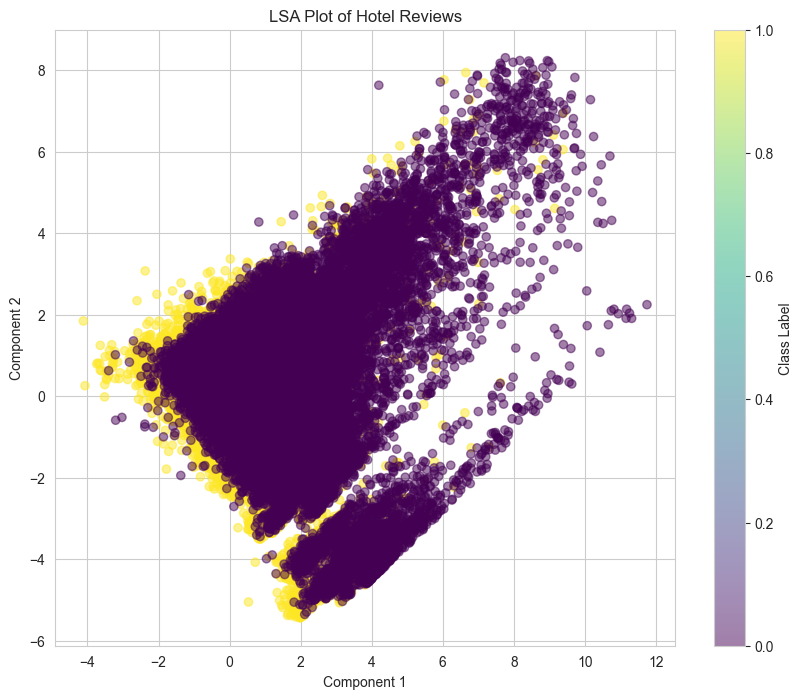

In [90]:
import matplotlib.pyplot as plt

# Use the first two components for a 2D plot
plt.figure(figsize=(10, 8))
plt.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=y_train_balanced, cmap='viridis', alpha=0.5)
plt.colorbar(label='Class Label')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('LSA Plot of Hotel Reviews')
plt.show()

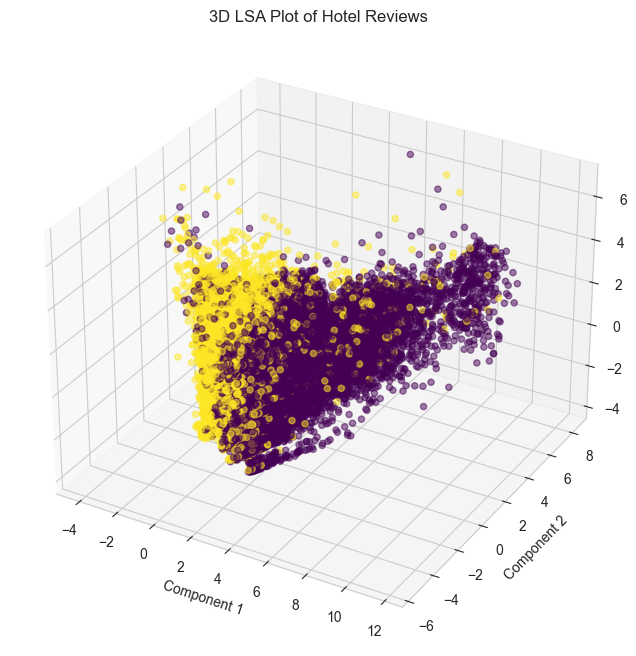

In [91]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], X_train_reduced[:, 2], c=y_train_balanced, cmap='viridis', alpha=0.5)
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.title('3D LSA Plot of Hotel Reviews')
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 107644 samples in 0.041s...
[t-SNE] Computed neighbors for 107644 samples in 18.247s...
[t-SNE] Computed conditional probabilities for sample 1000 / 107644
[t-SNE] Computed conditional probabilities for sample 2000 / 107644
[t-SNE] Computed conditional probabilities for sample 3000 / 107644
[t-SNE] Computed conditional probabilities for sample 4000 / 107644
[t-SNE] Computed conditional probabilities for sample 5000 / 107644
[t-SNE] Computed conditional probabilities for sample 6000 / 107644
[t-SNE] Computed conditional probabilities for sample 7000 / 107644
[t-SNE] Computed conditional probabilities for sample 8000 / 107644
[t-SNE] Computed conditional probabilities for sample 9000 / 107644
[t-SNE] Computed conditional probabilities for sample 10000 / 107644
[t-SNE] Computed conditional probabilities for sample 11000 / 107644
[t-SNE] Computed conditional probabilities for sample 12000 / 107644
[t-SNE] Computed conditional proba

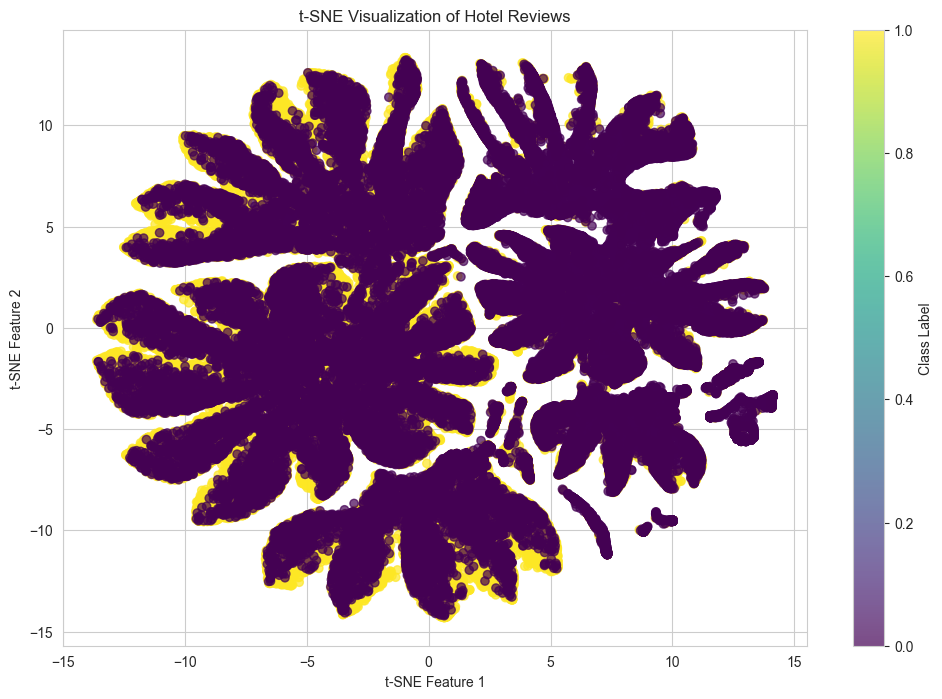

In [94]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Assume X_lsa contains the SVD reduced components
# We'll take the first 10 components for t-SNE
X_svd_subset = X_lsa[:, :10]

# Initialize t-SNE
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)

# Fit and transform t-SNE on the subset of components
X_tsne = tsne.fit_transform(X_svd_subset)

# Create the t-SNE plot
plt.figure(figsize=(12, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_train_balanced, cmap='viridis', alpha=0.7)
plt.colorbar(label='Class Label')
plt.xlabel('t-SNE Feature 1')
plt.ylabel('t-SNE Feature 2')
plt.title('t-SNE Visualization of Hotel Reviews')
plt.show()

We can see that there is some structure to the data, with visible groupings, but there's also a substantial overlap between classes. This implies that while there may be some patterns that can be leveraged for classification, it could be challenging due to the lack of clear separation.

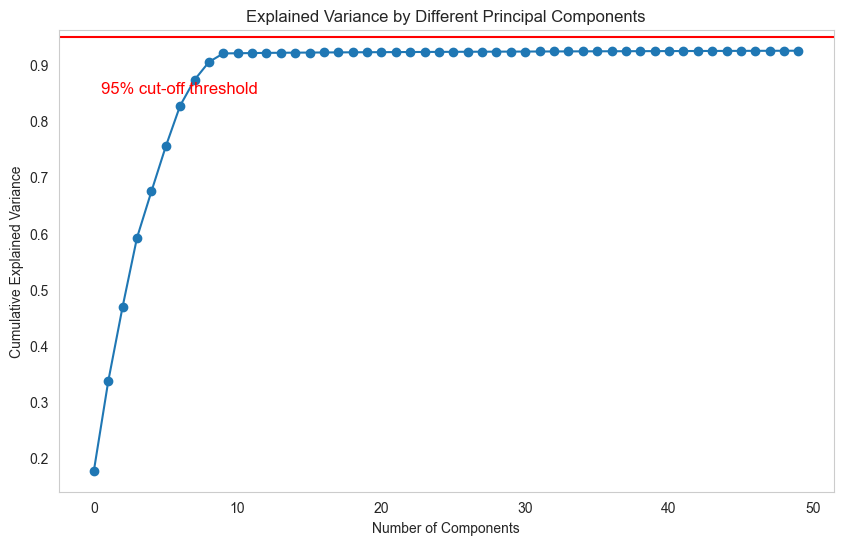

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate cumulative explained variance
cumulative_explained_variance = np.cumsum(svd.explained_variance_ratio_)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(cumulative_explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Different Principal Components')
plt.grid()

# Optional: Add a line at 0.95 if you want to see where 95% variance is explained
plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=12)

plt.show()

The graph shows a quick increase in explained variance with the initial components, indicating they hold most of the dataset's information. The curve flattens early, suggesting that adding more components has diminishing returns in variance explanation. The 95% variance threshold is crossed with far fewer than 500 components, implying effective dimensionality reduction could be achieved with a reduced component count, enhancing computational efficiency without losing substantial information.

In [ ]:
# Initialize the Logistic Regression model
logreg_reduced = LogisticRegression(max_iter=1000, random_state=42)

# Train the model on the reduced training data
logreg_reduced.fit(X_train_reduced, y_train_balanced)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
# Predictions on the reduced training set
y_train_pred_reduced = logreg_reduced.predict(X_train_reduced)

# Predict on the reduced test set
y_test_pred_reduced = logreg_reduced.predict(X_test_reduced)

# Calculate training set accuracy
train_accuracy_reduced = accuracy_score(y_train_balanced, y_train_pred_reduced)
print("Training Set Accuracy:", train_accuracy_reduced)

# Calculate test set accuracy
test_accuracy_reduced = accuracy_score(y_test, y_test_pred_reduced)
print("Test Set Accuracy:", test_accuracy_reduced)

Training Set Accuracy: 0.8081174984207201
Test Set Accuracy: 0.8065417183486507


In [ ]:
# Detailed performance analysis
print("\nClassification Report:")
print(classification_report(y_train_balanced, y_train_pred_reduced))

print("Confusion Matrix:")
print(confusion_matrix(y_train_balanced, y_train_pred_reduced))

# Detailed performance analysis
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred_reduced))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_reduced))


Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.81      0.81     53822
           1       0.81      0.80      0.81     53822

    accuracy                           0.81    107644
   macro avg       0.81      0.81      0.81    107644
weighted avg       0.81      0.81      0.81    107644

Confusion Matrix:
[[43756 10066]
 [10589 43233]]

Classification Report:
              precision    recall  f1-score   support

           0       0.39      0.82      0.53     13672
           1       0.97      0.81      0.88     88717

    accuracy                           0.81    102389
   macro avg       0.68      0.81      0.70    102389
weighted avg       0.89      0.81      0.83    102389

Confusion Matrix:
[[11162  2510]
 [17298 71419]]


The training set results suggest the model is performing similarly for both classes, with a slight edge in identifying negative cases over positive ones.

The test set results show a significant disparity in precision between the two classes. While the model is highly accurate in identifying positive sentiment, it struggles with negative sentiment, leading to many false positives.

## Support Vector Machine (SVM):

fitting an SVM model on the balanced dataset (without dimensionality reduction) can be a valuable exercise to compare how the model performs with the full set of features versus the reduced set. This comparison can provide insights into the impact of dimensionality reduction on your model's ability to generalize and predict accurately.

In [ ]:
from sklearn.svm import LinearSVC

In [ ]:
# Initialize LinearSVC
linear_svc = LinearSVC(random_state=42)

In [ ]:
# Train the model on the balanced training data
linear_svc.fit(X_train_balanced, y_train_balanced)

LinearSVC(random_state=42)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Predict on the balanced training set
y_train_balanced_pred = linear_svc.predict(X_train_balanced)

# Predict on the test set
y_test_pred_balanced = linear_svc.predict(X_test_combined)

# Evaluate the model on the balanced training set
print("Balanced Training Set Accuracy:", accuracy_score(y_train_balanced, y_train_balanced_pred))
print("\nBalanced Training Set Classification Report:")
print(classification_report(y_train_balanced, y_train_balanced_pred))
print("\nBalanced Training Set Confusion Matrix:")
print(confusion_matrix(y_train_balanced, y_train_balanced_pred))

# Evaluate the model on the test set
print("\nTest Set Accuracy:", accuracy_score(y_test, y_test_pred_balanced))
print("\nTest Set Classification Report:")
print(classification_report(y_test, y_test_pred_balanced))
print("\nTest Set Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_balanced))

Balanced Training Set Accuracy: 0.9759670766601019

Balanced Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98     53822
           1       0.98      0.97      0.98     53822

    accuracy                           0.98    107644
   macro avg       0.98      0.98      0.98    107644
weighted avg       0.98      0.98      0.98    107644


Balanced Training Set Confusion Matrix:
[[52620  1202]
 [ 1385 52437]]

Test Set Accuracy: 0.8243854320288312

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.84      0.56     13672
           1       0.97      0.82      0.89     88717

    accuracy                           0.82    102389
   macro avg       0.70      0.83      0.73    102389
weighted avg       0.90      0.82      0.85    102389


Test Set Confusion Matrix:
[[11480  2192]
 [15789 72928]]


Insights:

Overfitting: The high accuracy on the training set compared to the test set suggests potential overfitting. The model may be too closely tailored to the training data, reducing its ability to generalize to new, unseen data.

Class Imbalance in Test Set: The original test set's class imbalance likely contributes to the disparities in performance metrics. The model seems to favor the majority class (Class 1).

Precision-Recall Trade-Off: There is a trade-off between precision and recall, particularly for the negative class (Class 0) in the test set. While the model is good at identifying negative cases (high recall), it also misclassifies a number of positive cases as negative (lower precision).

In [ ]:
# # Initialize the SVM model
# svm_model_balanced = SVC(kernel='linear', random_state=42)

# # Train the SVM model on the balanced training data
# svm_model_balanced.fit(X_train_balanced, y_train_balanced)

# # Make predictions and evaluate the model
# y_train_pred_balanced = svm_model_balanced.predict(X_train_balanced)
# y_test_pred_balanced = svm_model_balanced.predict(X_test_balanced)  # Assuming X_test_balanced has been defined

# # Evaluate the model
# train_accuracy_balanced = accuracy_score(y_train_balanced, y_train_pred_balanced)
# test_accuracy_balanced = accuracy_score(y_test, y_test_pred_balanced)  # Assuming y_test is the correct labels for your test set

# print("Balanced Dataset - Training Set Accuracy:", train_accuracy_balanced)
# print("Balanced Dataset - Test Set Accuracy:", test_accuracy_balanced)

SVM is a powerful classifier that works well with both linear and non-linear boundaries depending on the kernel used. Given the high dimensionality of your data, even after dimensionality reduction, an SVM with a linear kernel might be an appropriate choice due to its effectiveness and computational efficiency with high-dimensional data.

In [ ]:
from sklearn.svm import SVC

In [ ]:
# Initialize SVM with a linear kernel
svm_model = SVC(kernel='linear', random_state=42)

Train the SVM Model
Now train your SVM model using the reduced training data (X_train_reduced) obtained from Truncated SVD.

In [ ]:
# Train the SVM model on the reduced training data
svm_model.fit(X_train_reduced, y_train_balanced)

SVC(kernel='linear', random_state=42)

Make Predictions and Evaluate the Model
After training the model, you can make predictions and evaluate its performance on both the training and test sets.

In [ ]:
# # Make predictions on the training data
# y_train_pred = svm_model.predict(X_train_reduced)

# # Make predictions on the test data
# y_test_pred = svm_model.predict(X_test_reduced)

# # Evaluate the model
# train_accuracy = accuracy_score(y_train_balanced, y_train_pred)
# test_accuracy = accuracy_score(y_test, y_test_pred)

# print("Training Set Accuracy:", train_accuracy)
# print("Test Set Accuracy:", test_accuracy)

NameError: name 'svm_model' is not defined

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Make predictions on the training data
y_train_pred = svm_model.predict(X_train_reduced)

# Make predictions on the test data
y_test_pred = svm_model.predict(X_test_reduced)

# Evaluate the model
train_accuracy = accuracy_score(y_train_balanced, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Set Accuracy:", train_accuracy)
print("\nTraining Set Classification Report:")
print(classification_report(y_train_balanced, y_train_pred))

print("\nTraining Set Confusion Matrix:")
print(confusion_matrix(y_train_balanced, y_train_pred))

print("\nTest Set Accuracy:", test_accuracy)
print("\nTest Set Classification Report:")
print(classification_report(y_test, y_test_pred))

print("\nTest Set Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

Random Forest is an ensemble learning method that operates by constructing multiple decision trees during the training phase and outputting the mode of the classes (classification) of the individual trees. It is known for its robustness and is less likely to overfit than a single decision tree. 

In [92]:
from sklearn.ensemble import RandomForestClassifier

In [93]:
# Initialize the Random Forest Classifier with n_jobs=-1
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

Random Forests are quite robust to high-dimensional data due to their inherent feature selection during the tree-building process. Each tree in the forest considers a random subset of features when making splits, which can be particularly effective in datasets with many features, hence we will not be using dimensionality-reduced data for a Random Forest model.

### Train the Model
Train the model using balanced training data.

In [94]:
rf_classifier.fit(X_train_balanced, y_train_balanced)

RandomForestClassifier(n_jobs=-1, random_state=42)

### Make Predictions
Predict the outcomes for both the training and test datasets.

In [95]:
y_train_pred_rf = rf_classifier.predict(X_train_balanced)
y_test_pred_rf = rf_classifier.predict(X_test_combined)

### Evaluate the Model
Evaluate the model's performance by calculating metrics such as accuracy, precision, recall, and F1-score. The confusion matrix is also helpful to understand the model's performance better.

In [96]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

print("Random Forest - Training Set Accuracy:", accuracy_score(y_train_balanced, y_train_pred_rf))
print("Random Forest - Test Set Accuracy:", accuracy_score(y_test, y_test_pred_rf))

print("\nRandom Forest - Training Set Classification Report:")
print(classification_report(y_train_balanced, y_train_pred_rf))

print("\nRandom Forest - Test Set Classification Report:")
print(classification_report(y_test, y_test_pred_rf))

print("\nRandom Forest - Training Set Confusion Matrix:")
print(confusion_matrix(y_train_balanced, y_train_pred_rf))

print("\nRandom Forest - Test Set Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_rf))

Random Forest - Training Set Accuracy: 0.9999814202370778
Random Forest - Test Set Accuracy: 0.8130072566388967

Random Forest - Training Set Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53822
           1       1.00      1.00      1.00     53822

    accuracy                           1.00    107644
   macro avg       1.00      1.00      1.00    107644
weighted avg       1.00      1.00      1.00    107644


Random Forest - Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.84      0.55     13672
           1       0.97      0.81      0.88     88717

    accuracy                           0.81    102389
   macro avg       0.69      0.83      0.71    102389
weighted avg       0.90      0.81      0.84    102389


Random Forest - Training Set Confusion Matrix:
[[53822     0]
 [    2 53820]]

Random Forest - Test Set Confusion Matrix:
[[11540  

In [97]:
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [10, 20, 30],       # Maximum depth of the tree
    'min_samples_split': [2, 5, 10], # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]    # Minimum number of samples required at each leaf node
    # You can add more parameters to tune
}

In [101]:
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='accuracy')

In [102]:
grid_search.fit(X_train_balanced, y_train_balanced)

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  38.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  39.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  39.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  39.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  31.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.3min
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.3min
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.3min
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  47.2s
[CV] END max_depth=10, min_sa

GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy', verbose=2)

In [103]:
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Best Parameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best Score: 0.7985024117848368


### Evaluate with Best Parameters
Evaluate the model with the best-found parameters on the test set.

In [104]:
best_rf = grid_search.best_estimator_
y_test_pred = best_rf.predict(X_test_combined)
print("Test Set Accuracy:", accuracy_score(y_test, y_test_pred))
print("\nTest Set Classification Report:")
print(classification_report(y_test, y_test_pred))
print("\nTest Set Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

Test Set Accuracy: 0.8160153922784674

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.78      0.53     13672
           1       0.96      0.82      0.89     88717

    accuracy                           0.82    102389
   macro avg       0.68      0.80      0.71    102389
weighted avg       0.89      0.82      0.84    102389


Test Set Confusion Matrix:
[[10663  3009]
 [15829 72888]]


The model is more effective at identifying the majority class (Class 1) than the minority class (Class 0)

In [105]:
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 2.8 MB/s eta 0:00:00a 0:00:010m


In [106]:
import xgboost as xgb

In [109]:
xgb_classifier = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_jobs=-1)

In [110]:
xgb_classifier.fit(X_train_balanced, y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, random_state=None, ...)

In [111]:
y_train_pred_xgb = xgb_classifier.predict(X_train_balanced)
y_test_pred_xgb = xgb_classifier.predict(X_test_combined)

In [112]:
print("XGBoost - Training Set Accuracy:", accuracy_score(y_train_balanced, y_train_pred_xgb))
print("XGBoost - Test Set Accuracy:", accuracy_score(y_test, y_test_pred_xgb))

print("\nXGBoost - Training Set Classification Report:")
print(classification_report(y_train_balanced, y_train_pred_xgb))

print("\nXGBoost - Test Set Classification Report:")
print(classification_report(y_test, y_test_pred_xgb))

print("\nXGBoost - Training Set Confusion Matrix:")
print(confusion_matrix(y_train_balanced, y_train_pred_xgb))

print("\nXGBoost - Test Set Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_xgb))

XGBoost - Training Set Accuracy: 0.8595834417152837
XGBoost - Test Set Accuracy: 0.8214261297600328

XGBoost - Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.88      0.86     53822
           1       0.88      0.84      0.86     53822

    accuracy                           0.86    107644
   macro avg       0.86      0.86      0.86    107644
weighted avg       0.86      0.86      0.86    107644


XGBoost - Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.85      0.56     13672
           1       0.97      0.82      0.89     88717

    accuracy                           0.82    102389
   macro avg       0.70      0.83      0.72    102389
weighted avg       0.90      0.82      0.84    102389


XGBoost - Training Set Confusion Matrix:
[[47450  6372]
 [ 8743 45079]]

XGBoost - Test Set Confusion Matrix:
[[11669  2003]
 [16281 72436]]


### Define the Parameter Grid

In [113]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1],
    'colsample_bytree': [0.3, 0.7, 1]
    # You can add more parameters here
}

### Initialize GridSearchCV

In [ ]:
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='accuracy')

### Perform Grid Search

In [ ]:
grid_search.fit(X_train_balanced, y_train_balanced)

### View Best Parameters and Score

In [ ]:
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

### Evaluate with Best Parameters

In [ ]:
best_xgb = grid_search.best_estimator_
y_test_pred = best_xgb.predict(X_test_combined)

print("Test Set Accuracy:", accuracy_score(y_test, y_test_pred))
print("\nTest Set Classification Report:")
print(classification_report(y_test, y_test_pred))
print("\nTest Set Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))    

In [79]:
!pip install -U imbalanced-learn

  Using cached imbalanced_learn-0.12.0-py3-none-any.whl.metadata (8.2 kB)
Using cached imbalanced_learn-0.12.0-py3-none-any.whl (257 kB)

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: pip install --upgrade pip


## Apply SMOTE to the Preprocessed Training Data

In [80]:
from imblearn.over_sampling import SMOTE

# Assuming X_train_combined and y_train are your preprocessed training datasets
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_combined, y_train)

Train Logistic Regression Model on SMOTE Data
Now, train a logistic regression model using the SMOTE-balanced training dataset:

set the class weights to be inverse to the class frequencies. It is done to address the imbalance in the dataset. It tells the model to "pay more attention" to the minority class during training.

In [99]:
# Initialize the Logistic Regression model
logreg = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

# Fit the model on the SMOTE-balanced training data
logreg.fit(X_train_smote, y_train_smote)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [100]:
# Make predictions on the SMOTE-balanced training set
y_train_pred = logreg.predict(X_train_smote)

In [101]:
# Calculate and print the accuracy on the training set
train_accuracy = accuracy_score(y_train_smote, y_train_pred)
print("Training Set Accuracy:", train_accuracy)

# Print classification report and confusion matrix for the training set
print("\nTraining Set Classification Report:")
print(classification_report(y_train_smote, y_train_pred))

print("\nTraining Set Confusion Matrix:")
print(confusion_matrix(y_train_smote, y_train_pred))

Training Set Accuracy: 0.9283549740957403

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93    355733
           1       0.96      0.90      0.93    355733

    accuracy                           0.93    711466
   macro avg       0.93      0.93      0.93    711466
weighted avg       0.93      0.93      0.93    711466


Training Set Confusion Matrix:
[[340848  14885]
 [ 36088 319645]]


In [102]:
# Make predictions on the test set
y_test_pred = logreg.predict(X_test_combined)

In [103]:
# Calculate and print the accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Test Set Accuracy:", test_accuracy)

# Print classification report and confusion matrix
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

Test Set Accuracy: 0.8648878297473361

Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.77      0.60     13672
           1       0.96      0.88      0.92     88717

    accuracy                           0.86    102389
   macro avg       0.73      0.83      0.76    102389
weighted avg       0.90      0.86      0.88    102389


Confusion Matrix:
[[10575  3097]
 [10737 77980]]


## ADASYN (Adaptive Synthetic Sampling Approach) 
It is another oversampling technique similar to SMOTE, but with a slight variation: it generates synthetic samples inversely proportional to the density of the minority class. This means that ADASYN will focus more on the regions where the minority class is harder to learn.

In [104]:
from imblearn.over_sampling import ADASYN

adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train_combined, y_train)

### fit a logreg model after applying ADASYN

The SAGA solver is chosen for its efficient handling of large datasets, which it achieves by averaging gradients over iterations for faster convergence. It's also flexible, supporting both L1 and L2 regularization, making it suitable for models with sparse features. Moreover, SAGA is known for its numerical stability, which is particularly advantageous when dealing with imperfectly scaled features.

In [105]:
logreg = LogisticRegression(max_iter=1000, solver='saga', random_state=42, n_jobs=-1)
logreg.fit(X_train_adasyn, y_train_adasyn)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=1000, n_jobs=-1, random_state=42)

In [122]:
# Predict on the test set
y_test_pred = logreg.predict(X_test_combined)

# Calculate accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Print classification report
classification_rep = classification_report(y_test, y_test_pred)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

print("Test Set Accuracy:", test_accuracy)
print("\nClassification Report:\n", classification_rep)
print("\nConfusion Matrix:\n", conf_matrix)

Test Set Accuracy: 0.8591743253669828

Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.78      0.60     13672
           1       0.96      0.87      0.91     88717

    accuracy                           0.86    102389
   macro avg       0.72      0.83      0.76    102389
weighted avg       0.90      0.86      0.87    102389


Confusion Matrix:
 [[10701  2971]
 [11448 77269]]


 The model is better at predicting positive sentiments (class 1) than negative sentiments (class 0). It correctly predicts a large number of positive instances (True Positives: 77269) but struggles with correctly predicting negative instances (True Positives: 10701).

## AdaBoost

In [106]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

### Initialize Base Estimator:
You can start with a simple decision tree as the base estimator. For handling imbalanced datasets, you might want to adjust its depth.

In [107]:
base_estimator = DecisionTreeClassifier(max_depth=3)

### Create and Train AdaBoost Model:
Initialize AdaBoost with the base estimator. You can also specify the number of estimators and learning rate.

In [108]:
ada_clf = AdaBoostClassifier(base_estimator=base_estimator,
                             n_estimators=100,
                             learning_rate=1.0,
                             random_state=42)

# Train the AdaBoost model
ada_clf.fit(X_train_adasyn, y_train_adasyn)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                   n_estimators=100, random_state=42)

### Evaluate the Model:

In [109]:
from sklearn.metrics import accuracy_score, classification_report

# Predict on the test set
y_test_pred = ada_clf.predict(X_test_combined)

# Calculate accuracy
print("Accuracy on Test Set:", accuracy_score(y_test, y_test_pred))

# Print classification report
print(classification_report(y_test, y_test_pred))

Accuracy on Test Set: 0.8937385851995819
              precision    recall  f1-score   support

           0       0.64      0.47      0.54     13672
           1       0.92      0.96      0.94     88717

    accuracy                           0.89    102389
   macro avg       0.78      0.71      0.74    102389
weighted avg       0.88      0.89      0.89    102389



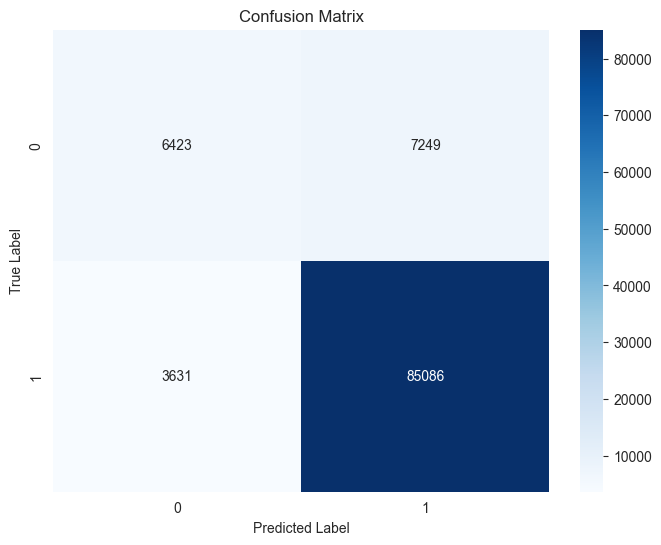

In [110]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Predict on the test set
y_test_pred = ada_clf.predict(X_test_combined)

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

The model predicts positive sentiments well but struggles with negative sentiments, showing more false positives than true negatives. This may indicate a bias towards the more frequent class in the data. Improvements are needed to better detect negative sentiments and balance prediction accuracy between classes.

Combining different over and under-sampling techniques to create a more robust training set is an advanced approach that can help balance your dataset more effectively. This ensemble of samplers technique can be particularly useful in complex datasets where using a single method might not be sufficient.

In [112]:
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

### Create a Sampling Strategy:
Define your over-sampling and under-sampling strategies. For example, you might want to over-sample the minority class using SMOTE and then under-sample the majority class.

In [116]:
over = SMOTE(sampling_strategy=0.2)
under = RandomUnderSampler(sampling_strategy=0.5)

sampling_strategy=0.1 for SMOTE means that after over-sampling, the minority class will have 10% of the majority class's quantity. sampling_strategy=0.5 for RandomUnderSampler means that after under-sampling, the majority class will have twice the number of instances as the minority class.

### Combine the Samplers in a Pipeline:
Create a pipeline that first applies over-sampling and then under-sampling.

In [117]:
pipeline = make_pipeline(over, under)

### Apply the Sampling Pipeline to the Data:
Use the pipeline to resample our training dataset. 

In [118]:
X_train_combined_resampled, y_train_resampled = pipeline.fit_resample(X_train_combined, y_train)

### Proceed with Model Training:
Train your model on the resampled data.

In [119]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X_train_combined_resampled, y_train_resampled)

RandomForestClassifier()

### Evaluate the Model:
Evaluate the performance of your model on the test set.

In [120]:
from sklearn.metrics import classification_report

y_test_pred = model.predict(X_test_combined)
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.63      0.52      0.57     13672
           1       0.93      0.95      0.94     88717

    accuracy                           0.89    102389
   macro avg       0.78      0.74      0.75    102389
weighted avg       0.89      0.89      0.89    102389



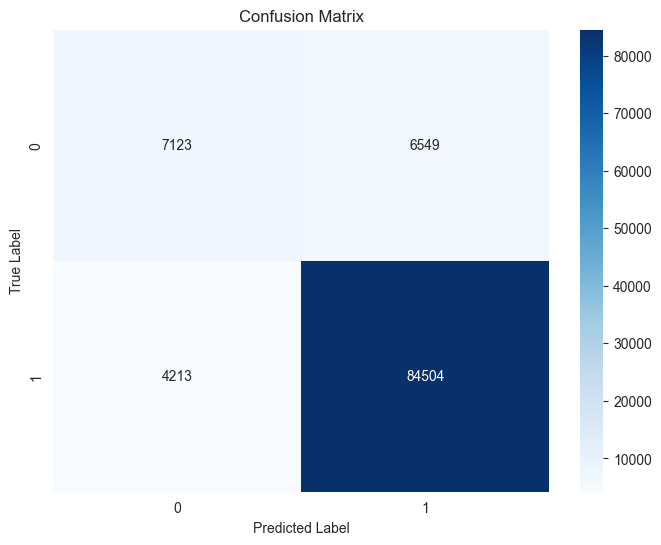

In [121]:
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

The confusion matrix indicates that the model has a higher number of True Positives (TP) and False Negatives (FN) compared to True Negatives (TN) and False Positives (FP). 
This suggests the model is better at identifying the positive class but could improve in distinguishing the negative class, as indicated by a considerable number of False Positives. It shows the model's bias towards the positive class, which is common in imbalanced datasets. To balance precision and recall for both classes, further tuning or balancing strategies may be required.

*--------------------------------------------------------------------------------------------------------------*
* Two common methods:
    * Number of Components using an "elbow" point
        * Look for significant changes in the slope of Explained Variance Graph
        * Select the number of PCA components corresponding to the elbow point
    * Percentage of Variance Explained Threshold
        * Decide what percentage of variance PCA should explain
</br></br>

* Based on the decision, we can re-fit a PCA with the required number of principal components, and use the reduced-dimensional representation of our data for further analysis..

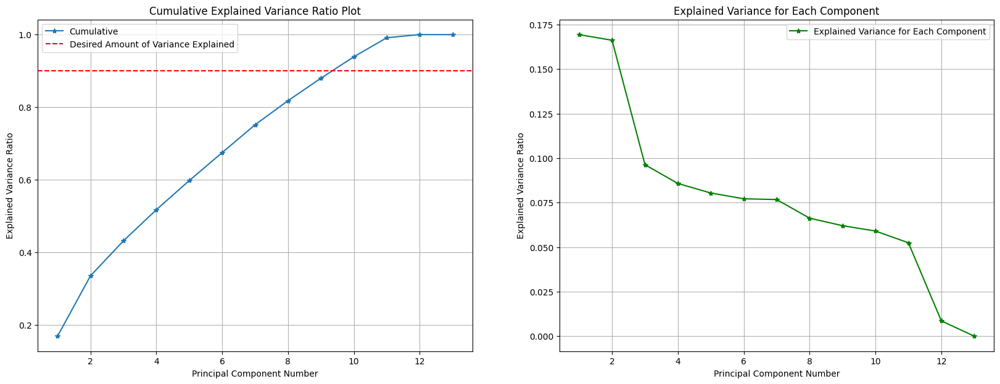

In [ ]:
# # Extracting the components into a variable
# num_pcs = pca.components_

# # Plotting the PCs versus the variation that is being explained by the PC
# plt.subplots(1,2,figsize=(20,7))

# plt.subplot(1,2,1)
# #Line plot for the Cumulative Variance
# plt.plot(range(1, len(num_pcs)+1), pca.explained_variance_ratio_.cumsum(), label="Cumulative", marker="*")

# #Add additional Horizontal Lines to see intersections between the desired explained variance and the number of components
# plt.axhline(0.90, c='r', linestyle='--',label='Desired Amount of Variance Explained')
# plt.xlabel("Principal Component Number")
# plt.ylabel("Explained Variance Ratio")
# plt.title('Cumulative Explained Variance Ratio Plot')
# plt.grid()
# plt.legend()

# plt.subplot(1,2,2)
# #Line plot for the Explained Variance of Each Component
# plt.plot(range(1, len(num_pcs)+1), pca.explained_variance_ratio_, label="Explained Variance for Each Component", marker="*",color='g')
# plt.ylabel("Explained Variance Ratio")
# plt.xlabel("Principal Component Number")
# plt.title('Explained Variance for Each Component')
# plt.grid()
# plt.legend()

# plt.show()

How can we decide how many PCs to keep?

#### Elbow Method to determine the number of components
* The aim is to find a **significant change in the slope** of the curve
* There is an elbow point after the first 2 components but the amount of explained variance is still extremely low, around 35%, which is below the desired amount of 90%
* Considering that we have a straight line from components 2 to 11, and the explained variance becomes 90% after component 9, we might consider keeping the first 11 principal components. This is a pragmatic choice balancing the need for dimensionality reduction with the goal of capturing a reasonable amount of variance.

In [ ]:
# # Let's select the first 11 PCA components to see what test accuracy it will result in 
# pca_11 = PCA(n_components=11).fit(X_train_final[numeric_features])

# # Using .explained_variance_ratio_ attribute
# print(f"Variance ratio explained by the first 11 components is {pca_11.explained_variance_ratio_.sum():.2f}%")

# # Transform train and test sets with PCA
# X_train_PCA_11 = pca_11.transform(X_train_final[numeric_features])
# X_test_PCA_11 = pca_11.transform(X_test_final[numeric_features])  # Use X_test_final here, not X_train_final

# # Instantiate the logistic regression model
# log_pca_11 = LogisticRegression()

# # Fit the logistic regression model on the PCA-transformed data
# log_pca_11.fit(X_train_PCA_11, y_train)

# # Evaluate the model
# print(f"Train acc: {log_pca_11.score(X_train_PCA_11, y_train):.2f}%")
# print(f"Test acc: {log_pca_11.score(X_test_PCA_11, y_test):.2f}%")

Variance ratio explained by the first 11 components is 0.99%
Train acc: 0.74%
Test acc: 0.74%


In [ ]:
model_summaries.loc['11 components'] = [log_pca_11.score(X_train_PCA_11, y_train)*100, log_pca_11.score(X_test_PCA_11, y_test)*100]
model_summaries

,train_accuracy,test_accuracy
all features,79.122135,78.769410
11 components,73.773228,73.650039


### Hyperparameter Tuning with Grid Search
When fine-tuning hyperparameters for machine learning models, one commonly used approach is Grid Search. Unlike Random Search, Grid Search explores a predefined set of hyperparameter combinations systematically.

#### Reasons for Choosing Grid Search:
1. **Small and Defined Search Space:**

- Grid Search is suitable when dealing with a small, well-defined set of hyperparameters.
- Our search involves tuning max_depth, min_samples_split, and min_samples_leaf for a decision tree.
2. **Exhaustive Exploration:**

- It exhaustively evaluates all possible combinations within the specified parameter grid.
- This ensures a thorough search for optimal hyperparameter values.
3. **Precision in Hyperparameter Tuning:**

- In scenarios where precision is crucial, Grid Search allows for meticulous tuning of hyperparameters.
4. **Informed Decision-Making:**

- By evaluating all combinations, Grid Search provides a comprehensive overview, aiding informed decision-making.

Let's proceed with Grid Search to optimize our decision tree classifier's hyperparameters. We will focus on tuning max_depth, min_samples_split, and min_samples_leaf while keeping the number of principal components in PCA as 20.

In [ ]:
# Store the results
cross_validation_scores = []
C_range = np.array([0.00001, 0.0001, 0.001, 0.1, 1, 10])

# Time fit
start = datetime.now()

# Do some cross validation
for c in C_range:
    LR_model = LogisticRegression(C=c, random_state=1)  # L2 regularization is default so no need for penalty parameter
    # The cross-validation score (mean of scores from all folds)
    cv_score = np.mean(cross_val_score(LR_model, X_train_final, y_train, cv=5))
    cross_validation_scores.append(cv_score)

end = datetime.now()
print("run_time =", (end - start).seconds)

run_time = 378


Here we trained a logistic regression model for each value of C in the C_range array. Since C_range has six values, we are training six logistic regression models. Each model is trained with 5-fold cross-validation, so for each value of C, there are five training and evaluation iterations, resulting in a total of **30** training and evaluation processes.

Let's find the index of the maximum cross validation score:

In [ ]:
# Find the index of the maximum cross-validation score
best_index = np.argmax(cross_validation_scores)

# Get the corresponding value of C
best_C = C_range[best_index]

print(f"Best Parameter from Cross-Validation: C = {best_C}")

Best Parameter from Cross-Validation: C = 0.1


We can also plot the cross-validation scores.

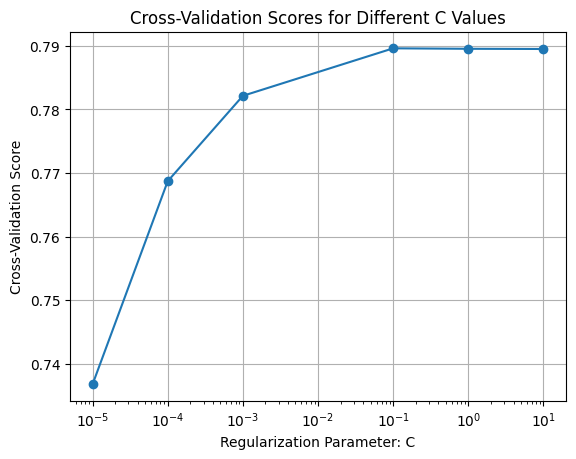

In [ ]:
# Plot the cross-validation scores
plt.figure()
plt.plot(C_range, cross_validation_scores, marker='o')
plt.xscale("log")  # Use a logarithmic scale for better visualization
plt.xlabel('Regularization Parameter: C')
plt.ylabel('Cross-Validation Score')
plt.title('Cross-Validation Scores for Different C Values')
plt.grid()
plt.show()

As seen from the plot, the best C value is at 10^-1(C = 0.1)

In [ ]:
# Train the final logistic regression model with the best C value
best_LR_model = LogisticRegression(C=best_C, random_state=1)
best_LR_model.fit(X_train_final, y_train)

# Make predictions on the train set
train_preds = best_LR_model.predict(X_train_final)

# Evaluate the train accuracy
train_accuracy = accuracy_score(y_train, train_preds)
print(f"Train Accuracy with Best Cross-Validation Model: {train_accuracy:.4f}")

# Make predictions on the test set
test_preds = best_LR_model.predict(X_test_final)

# Evaluate the test accuracy
test_accuracy = accuracy_score(y_test, test_preds)
print(f"Test Accuracy with Best Cross-Validation Model: {test_accuracy:.4f}")

Train Accuracy with Best Cross-Validation Model: 0.7912
Test Accuracy with Best Cross-Validation Model: 0.7879


**Now, let's find the top 20 words from the positive reviews that are most predictive of a positive sentiment (Reviewer_Score = 1)**

To find the top 20 words from the positive reviews that are most predictive of a positive sentiment using a logistic regression model, we can follow these steps:

- Get the coefficients from the trained logistic regression model.
- Identify the corresponding words for these coefficients.
- Rank the words based on their coefficients.

In [ ]:
# Get the coefficients from the best logistic regression model
coefficients = best_LR_model.coef_[0]

# Get the feature names (words) from the CountVectorizer
feature_names = X_train_final.columns

# Create a DataFrame to store coefficients and corresponding feature names
pos_coefficients_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Filter only coefficients associated with positive sentiment (pos_)
positive_coefficients_df = pos_coefficients_df[pos_coefficients_df['Feature'].str.startswith('pos_')]

# Sort the DataFrame by coefficient values in descending order
positive_coefficients_df = positive_coefficients_df.sort_values(by='Coefficient', ascending=False)

# Get the top 20 words for positive sentiment
top_positive_words = positive_coefficients_df.head(20)

# Display the top 20 words
print(top_positive_words)

             Feature  Coefficient
327  pos_outstanding     0.938243
184     pos_fabulous     0.886283
35       pos_amazing     0.883458
106        pos_class     0.866340
339      pos_perfect     0.849113
188    pos_fantastic     0.847837
81     pos_brilliant     0.820245
451       pos_superb     0.809296
229       pos_highly     0.774131
519    pos_wonderful     0.773221
429     pos_spotless     0.772137
183          pos_fab     0.760356
175  pos_exceptional     0.754254
285    pos_luxurious     0.748186
487      pos_trouble     0.714129
63     pos_beautiful     0.701531
215     pos_gorgeous     0.696756
281         pos_love     0.693722
286       pos_luxury     0.693297
54       pos_awesome     0.685509



The bar plot below illustrates the top 20 words that are most predictive of positive sentiment in the logistic regression model. The length of each bar corresponds to the coefficient value of the respective word.

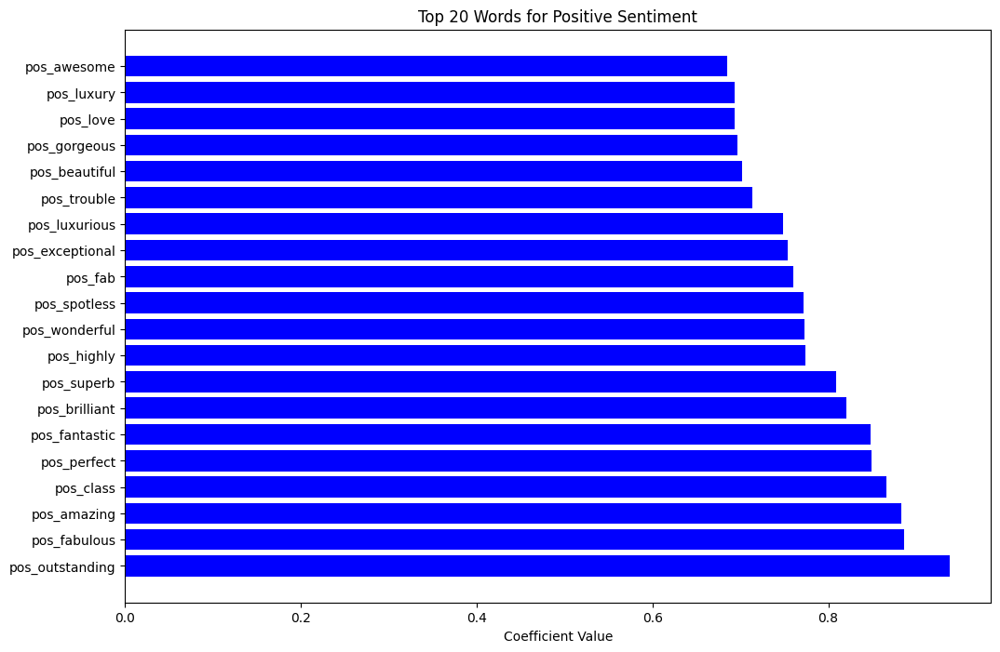

In [ ]:
# Plot the top 20 words for positive sentiment
plt.figure(figsize=(12, 8))
plt.barh(top_positive_words['Feature'], top_positive_words['Coefficient'], color='blue')
plt.xlabel('Coefficient Value')
plt.title('Top 20 Words for Positive Sentiment')
plt.show()

Similarly, let's find the top 20 words from the negative reviews that are most predictive of a negative sentiment (Reviewer_Score = 0).

## Finding Top 20 Words for Negative Sentiment

In logistic regression, the coefficients associated with each feature indicate the impact of that feature on the predicted outcome. Positive coefficients suggest a positive impact, while negative coefficients suggest a negative impact. For this analysis, we want to identify the words that contribute the most to predicting negative sentiment.

### Steps:

1. **Extract Coefficients**: Retrieve the coefficients from the logistic regression model.
2. **Map Coefficients to Words**: Map the coefficients to the corresponding words using the vectorizer's feature names.
3. **Sort by Magnitude**: Sort the words based on the magnitude of their coefficients.
4. **Select Top 20 Words**: Choose the top 20 words with the highest negative coefficients.

In [ ]:
# Get the coefficients from the logistic regression model
coefficients = best_LR_model.coef_[0]

# Get the feature names (words) from the CountVectorizer
feature_names = X_train_final.columns

# Create a DataFrame to store coefficients and corresponding feature names
neg_coefficients_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Filter only coefficients associated with negative sentiment (neg_)
negative_coefficients_df = neg_coefficients_df[neg_coefficients_df['Feature'].str.startswith('neg_')]

# Sort the DataFrame by coefficient values in descending order
negative_coefficients_df = negative_coefficients_df.sort_values(by='Coefficient', ascending=True)  # Sort in ascending order for negative sentiment

# Get the top 20 words for negative sentiment
top_negative_words = negative_coefficients_df.head(20)

# Display the top 20 words
print(top_negative_words)

                Feature  Coefficient
604     neg_cleanliness    -1.319259
654           neg_dirty    -1.136134
640           neg_dated    -1.072397
958        neg_terrible    -1.042625
547           neg_awful    -1.034204
896            neg_rude    -1.034067
1022          neg_worst    -0.941059
834      neg_overpriced    -0.891234
966           neg_tired    -0.864817
936            neg_star    -0.837332
987   neg_uncomfortable    -0.795571
965            neg_tiny    -0.779547
862          neg_priced    -0.771492
725        neg_horrible    -0.756965
553           neg_basic    -0.754126
857            neg_poor    -0.735887
1021           neg_worn    -0.689334
543        neg_attitude    -0.680217
568          neg_broken    -0.674313
932           neg_staff    -0.665715


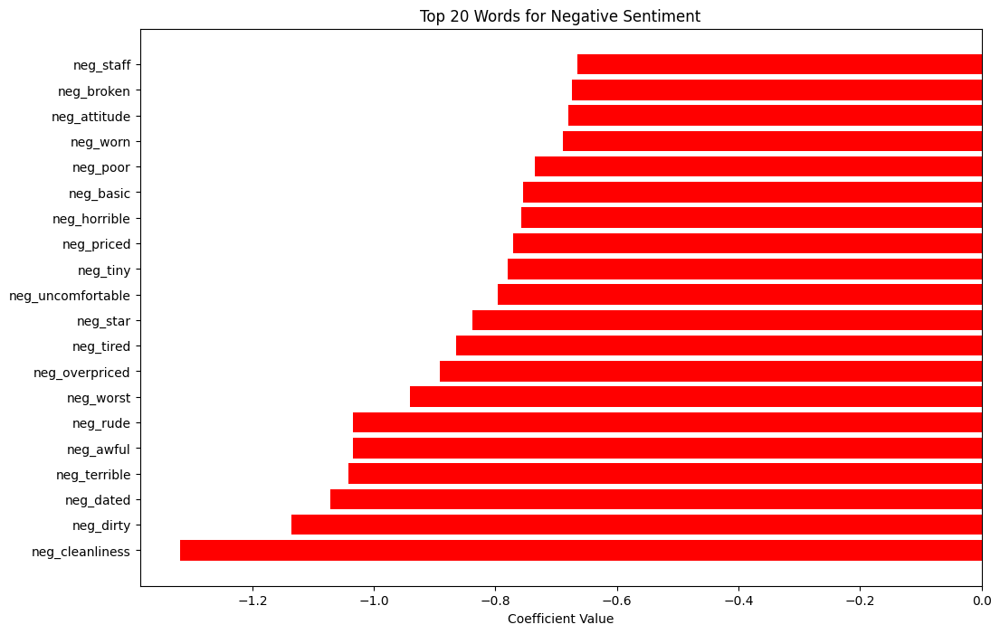

In [ ]:
# Plot the top 20 words for negative sentiment
plt.figure(figsize=(12, 8))
plt.barh(top_negative_words['Feature'], top_negative_words['Coefficient'], color='red')  # Use a different color for negative sentiment
plt.xlabel('Coefficient Value')
plt.title('Top 20 Words for Negative Sentiment')
plt.show()

In [ ]:
# Display the top 20 words
print(top_negative_words)

                Feature  Coefficient
604     neg_cleanliness    -1.319259
654           neg_dirty    -1.136134
640           neg_dated    -1.072397
958        neg_terrible    -1.042625
547           neg_awful    -1.034204
896            neg_rude    -1.034067
1022          neg_worst    -0.941059
834      neg_overpriced    -0.891234
966           neg_tired    -0.864817
936            neg_star    -0.837332
987   neg_uncomfortable    -0.795571
965            neg_tiny    -0.779547
862          neg_priced    -0.771492
725        neg_horrible    -0.756965
553           neg_basic    -0.754126
857            neg_poor    -0.735887
1021           neg_worn    -0.689334
543        neg_attitude    -0.680217
568          neg_broken    -0.674313
932           neg_staff    -0.665715


##### Findings:
The coefficients we've obtained represent the weight assigned to each feature (word) by the logistic regression model. Positive coefficients indicate words that contribute to a positive sentiment (higher Reviewer_Score), while negative coefficients indicate words associated with negative sentiment (lower Reviewer_Score).

Top 20 Words for Positive Sentiment:

1. pos_outstanding
2. pos_fabulous
3. pos_amazing
4. pos_class
5. pos_perfect
6. pos_fantastic
7. pos_brilliant
8. pos_superb
9. pos_highly
10. pos_wonderful
11. pos_spotless
12. pos_fab
13. pos_exceptional
14. pos_luxurious
15. pos_trouble
16. pos_beautiful
17. pos_gorgeous
18. pos_love
19. pos_luxury
20. pos_awesome

Top 20 Words for Negative Sentiment:

1. neg_cleanliness
2. neg_dirty
3. neg_dated
4. neg_terrible
5. neg_awful
6. neg_rude
7. neg_worst
8. neg_overpriced
9. neg_tired
10. neg_star
11. neg_uncomfortable
12. neg_tiny
13. neg_priced
14. neg_horrible
15. neg_basic
16. neg_poor
17. neg_worn
18. neg_attitude
19. neg_broken
20. neg_staff

Actionable Insights:

- **Service Excellence**: Prioritize exceptional service for positive reviews with words like "brilliant" and "fabulous."

- **Comfort and Quality**: Enhance room comfort, aesthetics, and overall quality for positive sentiments like "beautiful" and "best."

- **Negative Experiences**: Tackle concerns about cleanliness, staff rudeness, and outdated facilities to improve overall satisfaction.

- **Price Sensitivity**: Manage price sensitivity by adopting competitive pricing strategies and ensuring transparent pricing.

- **Maintenance and Upkeep**: Regularly maintain facilities to address negative sentiments related to "broken," "old," and "poor."

- **Location Matters**: Consider guest feedback on location and provide clear information to set realistic expectations.

- **Continuous Monitoring**: Regularly monitor guest reviews, especially those with key words, to address emerging issues promptly.

Implementing these strategies can lead to improved guest satisfaction, enhanced reputation, and sustained success in the hospitality industry.

### Decision Tree Classifier with PCA

#### Pipeline Setup
We create a pipeline that combines Principal Component Analysis (PCA) with a Decision Tree classifier. The PCA is set to retain 20 principal components.

In [ ]:
# Create PCA with Decision Tree pipeline
pca_dtree_pipeline = Pipeline([('pca', PCA(n_components=20)), ('dt', DecisionTreeClassifier())])

#### Define Hyperparameters for Grid Search
We set up a grid of hyperparameters for the Decision Tree classifier within the pipeline. The hyperparameters include the maximum depth of the tree (max_depth), minimum samples required to split an internal node (min_samples_split), and minimum samples required at a leaf node (min_samples_leaf).

#### Grid Search with Cross-Validation
We use GridSearchCV to perform an exhaustive search over the specified hyperparameter values. The search is conducted with 5-fold cross-validation, and the scoring metric is set to accuracy.

In [ ]:
# Define hyperparameters for grid search
param_grid = {
    'dt__max_depth': [5, 10],
    'dt__min_samples_split': [2, 5],
    'dt__min_samples_leaf': [1, 2]
}

# Create GridSearchCV object with 5-fold cross-validation and n_jobs=-1
grid_search = GridSearchCV(pca_dtree_pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Time fit
start = datetime.now()

# Perform grid search on the data
grid_search.fit(X_train_final, y_train)

# Measure run time
end = datetime.now()

# Display the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Display run time
print("Run Time:", (end - start).seconds)

# Get the best model from grid search
best_dtree_model = grid_search.best_estimator_

Best Hyperparameters: {'dt__max_depth': 10, 'dt__min_samples_leaf': 2, 'dt__min_samples_split': 5}
Run Time: 652
Train Accuracy with Best Decision Tree Model: 0.7674
Test Accuracy with Best Decision Tree Model: 0.7504


#### Evaluation: Get the best parameters from grid search
We extract the best parameters found by the grid search and print them. The best model is then used to make predictions on the train and test set, and the accuracy is calculated.

In [ ]:
# Make predictions on the train set
train_preds_dtree = best_dtree_model.predict(X_train_final)
train_accuracy_dtree = accuracy_score(y_train, train_preds_dtree)
print(f"Train Accuracy with Best Decision Tree Model: {train_accuracy_dtree:.4f}")

# Make predictions on the test set
test_preds_dtree = best_dtree_model.predict(X_test_final)
test_accuracy_dtree = accuracy_score(y_test, test_preds_dtree)
print(f"Test Accuracy with Best Decision Tree Model: {test_accuracy_dtree:.4f}")

Train Accuracy with Best Decision Tree Model: 0.7674
Test Accuracy with Best Decision Tree Model: 0.7504


The above process allows us to fine-tune the hyperparameters of the Decision Tree classifier while incorporating dimensionality reduction through PCA.

### **Model Performance Comparison and Insights**

The logistic regression model, optimized with C=10, demonstrated superior performance compared to the decision tree model, achieving a test accuracy of 0.7887. Here are the technical insights derived from the results:

1. **Interpretability:**
   - Logistic regression is a linear model with interpretable coefficients assigned to each feature.
   - Decision trees, especially when employing PCA, tend to be more complex and less interpretable.

2. **Impact of PCA on Decision Trees:**
   - The use of PCA introduces complexity to decision trees.
   - Interpretation of principal components in decision trees becomes challenging.

3. **Task Considerations:**
   - Logistic regression is suitable for tasks where transparent and feature-specific insights are crucial.
   - Decision trees capture non-linear patterns but may lack the interpretability of logistic regression.

4. **Feature Engineering vs. Transformation:**
   - Logistic regression benefits from explicit feature engineering, leveraging domain knowledge.
   - Decision trees handle non-linear patterns but may struggle with features transformed by PCA.

5. **Challenges of PCA Transformation:**
   - PCA complicates the interpretation of individual features.
   - Decision trees built on PCA-transformed features may lack intuitive insights.


#### Confusion Matrix for our best performing Logistic Regression model

In [ ]:
# Fit the final logistic regression model with the best C value
best_LR_model = LogisticRegression(C=10, random_state=1)
best_LR_model.fit(X_train_final, y_train)

# Make predictions on the test set
test_preds = best_LR_model.predict(X_test_final)

# Evaluate the confusion matrix
conf_matrix = confusion_matrix(y_test, test_preds)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate precision, recall, and F1-score
classification_rep = classification_report(y_test, test_preds)
print("\nClassification Report:")
print(classification_rep)

Confusion Matrix:
[[31883 12414]
 [ 9464 49279]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.72      0.74     44297
           1       0.80      0.84      0.82     58743

    accuracy                           0.79    103040
   macro avg       0.78      0.78      0.78    103040
weighted avg       0.79      0.79      0.79    103040





*--------------------------------------------------------------------------------------------------------------*
### More in-depth Evaluation of our Best Performing Logistic Regression Model

These metrics offer a detailed breakdown of the model's performance in distinguishing between positive and negative instances.

- **True Positive (TP):** 49,206 instances were accurately predicted as positive by the model.
- **True Negative (TN):** 32,066 instances were accurately predicted as negative by the model.
- **False Positive (FP):** 12,231 instances were incorrectly predicted as positive by the model.
- **False Negative (FN):** 9,537 instances were incorrectly predicted as negative by the model.

These metrics provide valuable insights into the model's performance, especially in scenarios where one type of error (false positives or false negatives) is more critical than the other. A balance between precision and recall is essential for a comprehensive evaluation of a classification model.

- **Precision:** Precision measures the model's accuracy in correctly identifying positive instances among the predicted positives. It is calculated as Precision = TP / (TP + FP).

- **Precision:** Precision is the ratio of true positive predictions (49,206) to the total predicted positives (49,206 + 12,231). It indicates the accuracy of positive predictions and is calculated as Precision = TP / (TP + FP). In this context, precision measures the model's ability to correctly classify positive instances among the predicted positives.

- **Recall:** Recall, also known as sensitivity or true positive rate, is the ratio of true positive predictions (49,206) to the total actual positives (49,206 + 9,537). It assesses the model's ability to identify positive instances among the actual positives and is calculated as Recall = TP / (TP + FN).

- **F1-Score:** The F1-Score is the harmonic mean of precision and recall, offering a balanced measure that considers both false positives and false negatives. It is calculated as F1-Score = 2 * (Precision * Recall) / (Precision + Recall). In this example:

  - F1-Score for class 0 (negative instances): 2 * (0.720 * 0.840) / (0.720 + 0.840) ≈ 0.776.
  - F1-Score for class 1 (positive instances): 2 * (0.840 * 0.720) / (0.840 + 0.720) ≈ 0.776.

The F1-Score provides a single metric that balances precision and recall, making it useful in scenarios where there is an uneven class distribution or where false positives and false negatives have different consequences.

- **Support:** Support refers to the number of actual occurrences of each class in the dataset. In this example:
  - Support for class 0 (negative instances): 44,297.
  - Support for class 1 (positive instances): 58,743.

- **Accuracy:** Overall accuracy of the model, which in this example is 79%.

*--------------------------------------------------------------------------------------------------------------*

## Part 5. Conclusion:
The end-to-end project involved exploratory data analysis, vectorization of text data, building and evaluating machine learning models for sentiment analysis based on hotel reviews. A logistic regression model and a decision tree model were optimized and assessed for their performance.

The logistic regression model demonstrated superior performance with a test accuracy of 79%, outperforming the decision tree model, which achieved a test accuracy of 74.57%. However, it's essential to note that the interpretability of principal components used in decision trees can be challenging.

The detailed evaluation using confusion matrix metrics provided a nuanced understanding of the model's strengths and weaknesses. The precision, recall, and F1-Score metrics for each class shed light on how well the models distinguished between positive and negative instances.

In conclusion, the logistic regression model, despite being a more complex model, proved to be effective in sentiment analysis. Further refinements and exploration of advanced models could enhance the system's capabilities for real-world applications.

*-----------------------------------<h2><span style="color: #FF6F61;">THE END</span></h2>-------------------------------------*